# Ciclo invertido: parametros -> DDPM -> imagen -> Xception -> parametros

A diferencia del notebook *ciclo-completo*, aqui empezamos por los **parametros** y vamos hacia
la imagen, no al reves:

1. **Tarea directa (DDPM)**: tomamos un vector de 8 parametros fisicos y generamos una imagen
   `(40, 40)` con el DDPM condicionado.
2. **Tarea inversa (Xception V3100)**: la imagen generada se pasa por el Xception inverso (reentrenado,
   cabeza nueva `GAP -> BN -> Drop -> Dense(256) -> BN -> Drop -> Dense(8)`) que re-estima los
   8 parametros.
3. **Comparaciones**:
   - **Parametros**: originales (input) vs re-estimados (output). MAE, R^2, % acierto y % error
     relativo por parametro.
   - **Imagen**: original (del dataset, con el mismo indice) vs generada por el DDPM. MSE, SSIM,
     FFT-corr, FFT-MSE.
   - **Fisicas**: magnetizacion `M`, `|M|`, susceptibilidad `chi`, calor especifico `Cv`, energia
     `E`, aplicadas a ambas imagenes y comparadas en el disco del nanodot (rd=18.3 px).

### Sobre los dos scalers
Los pesos del Xception (avances-tava) y del DDPM (models-comparison-02) fueron entrenados con
**MinMaxScaler distintos**. Reproducimos ambos:
- `scaler_inv`  : del Xception, ajustado sobre el 70% del dataset completo.
- `scaler_ddpm` : del DDPM, ajustado sobre el 70% de un subsample del 10%.

```
y_phys (input) --scaler_ddpm.transform--> y_ddpm_norm --DDPM--> img_gen (40,40, [-1,1])
                                                                       |
                                                                       v
                                                              preprocess_inv (224x224, RGB)
                                                                       |
                                                                       v
                                                              Xception --> y_pred_norm
                                                                       |
                                                              scaler_inv.inverse_transform
                                                                       |
                                                                       v
                                                              y_phys (output)
```

### Sobre las metricas fisicas
Las simulaciones MC originales proveen **una sola configuracion por punto de parametros**, asi que
las observables de segundo momento (`chi`, `Cv`) no se pueden evaluar directamente con sus
definiciones termodinamicas. Usamos:

- **`M`, `|M|`, `E`**: estimadores instantaneos (insesgados sobre una configuracion).
- **`chi`**: regla de suma fluctuacion-disipacion sobre la funcion de correlacion espacial
  estimada por FFT (Wiener-Khinchin) - Newman & Barkema (1999), §3.7.
- **`Cv`**: metodo de fluctuaciones por subsistema (Binder 1981; Landau & Binder 2014, cap. 4),
  con factor de area de bloque |B| incluido.
- Todas las observables se restringen al **disco del nanodot** (rd=18.3 px); fuera de el
  el campo de espines es 0 por construccion del dataset.

## 0. Setup: Colab + descarga de datasets desde Kaggle

Ejecuta esta celda primero. Sube tu `kaggle.json` cuando se solicite.

In [ ]:
# ── Instalar dependencias que pueden faltar en Colab ──
import subprocess, sys

def pip(pkg):
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pkg])

pip("kaggle")
pip("scikit-image")

# ── Autenticacion Kaggle ──
import os
from google.colab import files

if not os.path.exists("/root/.kaggle/kaggle.json"):
    print("Sube tu kaggle.json:")
    uploaded = files.upload()
    os.makedirs("/root/.kaggle", exist_ok=True)
    with open("/root/.kaggle/kaggle.json", "wb") as fp:
        fp.write(list(uploaded.values())[0])
    os.chmod("/root/.kaggle/kaggle.json", 0o600)
    print("kaggle.json guardado.")
else:
    print("kaggle.json ya existe.")

# ── Descargar datasets ──
WORKDIR = "/content"
DATA_DIR = f"{WORKDIR}/kaggle_data"
os.makedirs(DATA_DIR, exist_ok=True)

datasets = [
    "carloscanamejoy/dataset-spines-united-v2",
    "carloscanamejoy/weights-xception-model",
    "carloscanamejoy/weights-models",
]

import subprocess
for ds in datasets:
    name = ds.split("/")[1]
    dest = f"{DATA_DIR}/{name}"
    if not os.path.exists(dest):
        print(f"Descargando {ds} ...")
        subprocess.check_call([
            "kaggle", "datasets", "download", "-d", ds,
            "-p", dest, "--unzip"
        ])
        print(f"  -> {dest}")
    else:
        print(f"  Ya existe: {dest}")

print("\nContenido de DATA_DIR:")
for root, dirs, ffiles in os.walk(DATA_DIR):
    level = root.replace(DATA_DIR, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f'{indent}{os.path.basename(root)}/')
    subindent = ' ' * 2 * (level + 1)
    for fname in ffiles:
        size = os.path.getsize(os.path.join(root, fname))
        print(f'{subindent}{fname}  ({size/1e6:.1f} MB)')


Sube tu kaggle.json:


Saving kaggle.json to kaggle.json
kaggle.json guardado.
Descargando carloscanamejoy/dataset-spines-united-v2 ...
  -> /content/kaggle_data/dataset-spines-united-v2
Descargando carloscanamejoy/weights-xception-model ...
  -> /content/kaggle_data/weights-xception-model
Descargando carloscanamejoy/weights-models ...
  -> /content/kaggle_data/weights-models

Contenido de DATA_DIR:
kaggle_data/
  dataset-spines-united-v2/
    dataset_unificado_v2.npz  (442.8 MB)
  weights-models/
    xception-cvae-weights.h5  (112.3 MB)
    ddpm_spines_final_39crop.pt  (144.6 MB)
    vit-cvae-weights.h5  (367.8 MB)
    ddpm-weights.pt  (144.6 MB)
    ddpm_spines_datacomplete.pt  (144.6 MB)
  weights-xception-model/
    modelo_xception_fulldatabaseV2.h5  (250.7 MB)
    modelo_xception_structure.keras  (256.9 MB)
    modelo_xception_fulldatabaseV3100.h5  (256.9 MB)


## 1. Configuracion y rutas

In [ ]:
from pathlib import Path
import os

WORKDIR = "/content"
DATA_DIR = f"{WORKDIR}/kaggle_data"

DATASET_PATH         = Path(f"{DATA_DIR}/dataset-spines-united-v2/dataset_unificado_v2.npz")
XCEPTION_INV_WEIGHTS = Path(f"{DATA_DIR}/weights-xception-model/modelo_xception_fulldatabaseV3100.h5")
DDPM_CHECKPOINT      = Path(f"{DATA_DIR}/weights-models/ddpm_spines_final_39crop.pt")

# Verificar que existen
for p in [DATASET_PATH, XCEPTION_INV_WEIGHTS, DDPM_CHECKPOINT]:
    status = "OK" if p.exists() else "NO ENCONTRADO"
    print(f"[{status}] {p}")

PARAM_NAMES = ["T", "Jex2", "Jex3", "Jex4", "Kan1", "KanS", "Hex", "KDM"]
N_OUTPUTS   = 8
COND_DIM    = 8

# Split del Xception (avances-tava): scaler_inv y test set
INV_SPLIT_SEED       = 42
INV_TEST_FRACTION    = 0.15
INV_VAL_FRACTION_REL = 0.1765

# Split del DDPM (models-comparison-02): scaler_ddpm y (mn,mx) de imagen
DDPM_SEED            = 42
DDPM_SUBSAMPLE_FRAC  = 1.0   # nuevo DDPM entrenado sobre 100% del dataset
DDPM_IMG_SIZE        = 40

# Inferencia
TARGET_HW_INV   = (224, 224)
DDPM_FAST_STEPS = 100

# Evaluacion masiva (analisis global)
N_BATCH_EVAL    = 1000       # cuantas muestras para tablas/plots de MAE/R^2/% error
BATCH_SEED      = 7
EPS_REL_FRAC    = 0.01      # mismo suelo del denominador que en eval_xception

print("\nConfigurado.")


[OK] /content/kaggle_data/dataset-spines-united-v2/dataset_unificado_v2.npz
[OK] /content/kaggle_data/weights-xception-model/modelo_xception_fulldatabaseV3100.h5
[OK] /content/kaggle_data/weights-models/ddpm_spines_final_39crop.pt

Configurado.


## 2. Imports y dataset

In [ ]:
import os, math, time, sys, subprocess
os.environ.setdefault("KERAS_BACKEND", "tensorflow")
os.environ.setdefault("TF_CPP_MIN_LOG_LEVEL", "2")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

# scikit-image para SSIM
try:
    from skimage.metrics import structural_similarity as ssim_fn
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "scikit-image"])
    from skimage.metrics import structural_similarity as ssim_fn

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"TF: {tf.__version__} | Torch: {torch.__version__} | Device: {DEVICE}")
for gpu in tf.config.list_physical_devices("GPU"):
    try: tf.config.experimental.set_memory_growth(gpu, True)
    except Exception: pass

data   = np.load(DATASET_PATH, mmap_mode="r")
imgs   = data["img"]
params = np.asarray(data["params"])
labels = np.asarray(data["labels"]) if "labels" in data.files else None
N = imgs.shape[0]
print(f"Dataset: {N:,} muestras | imgs {imgs.shape} | params {params.shape}")
if labels is not None:
    CLUSTER_IDS = np.unique(labels).tolist()
    print(f"Labels (clusters): {labels.shape} | dtype={labels.dtype} | "
          f"ids unicos = {CLUSTER_IDS}")
    print("Conteo por cluster:")
    for cid in CLUSTER_IDS:
        n = int((labels == cid).sum())
        print(f"  cluster {int(cid):>3} : {n:>6,} muestras "
              f"({100*n/N:5.2f}%)")
else:
    print("NOTA: el .npz no tiene 'labels'. Los analisis por cluster se desactivan.")
    CLUSTER_IDS = []


TF: 2.20.0 | Torch: 2.11.0+cu128 | Device: cuda
Dataset: 169,671 muestras | imgs (169671, 39, 39, 1) | params (169671, 8)
Labels (clusters): (169671,) | dtype=int32 | ids unicos = [4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 17]
Conteo por cluster:
  cluster   4 : 36,611 muestras (21.58%)
  cluster   5 : 61,670 muestras (36.35%)
  cluster   6 : 19,320 muestras (11.39%)
  cluster   8 :  6,079 muestras ( 3.58%)
  cluster  10 : 15,584 muestras ( 9.18%)
  cluster  11 :  7,731 muestras ( 4.56%)
  cluster  12 :  2,680 muestras ( 1.58%)
  cluster  13 :  3,059 muestras ( 1.80%)
  cluster  14 :    350 muestras ( 0.21%)
  cluster  15 :  3,667 muestras ( 2.16%)
  cluster  16 :  6,641 muestras ( 3.91%)
  cluster  17 :  6,279 muestras ( 3.70%)


## 3. Reproducir los dos splits y ajustar los dos `MinMaxScaler`

Mismos splits que en *ciclo-completo*. Tambien calculamos `(mn, mx)` con que el DDPM normalizo las
imagenes a `[-1, 1]`, para preprocesar igual la imagen original cuando la comparemos contra la
imagen generada.


In [ ]:
# (a) Xception inv: scaler_inv y test set
all_idx = np.arange(N)
idx_train_pool, idx_test_inv, _, _ = train_test_split(
    all_idx, params, test_size=INV_TEST_FRACTION, random_state=INV_SPLIT_SEED)
idx_train_inv, idx_val_inv, _, _ = train_test_split(
    idx_train_pool, params[idx_train_pool],
    test_size=INV_VAL_FRACTION_REL, random_state=INV_SPLIT_SEED)
scaler_inv = MinMaxScaler().fit(params[idx_train_inv])
print(f"scaler_inv  data_min: {np.round(scaler_inv.data_min_, 4)}")
print(f"scaler_inv  data_max: {np.round(scaler_inv.data_max_, 4)}")

# (b) DDPM: scaler_ddpm + (mn, mx) del subsample 10% redimensionado a 40x40
rng = np.random.RandomState(DDPM_SEED)
sub_idx = rng.choice(N, size=int(N * DDPM_SUBSAMPLE_FRAC), replace=False)
params_sub_raw = params[sub_idx]
imgs_sub       = np.asarray(imgs[sub_idx]).astype(np.float32)

idx_all_sub = np.arange(len(sub_idx))
idx_tr_sub, idx_temp_sub = train_test_split(idx_all_sub, test_size=0.30, random_state=DDPM_SEED)
idx_val_sub, idx_te_sub   = train_test_split(idx_temp_sub, test_size=0.50, random_state=DDPM_SEED)

scaler_ddpm = MinMaxScaler().fit(params_sub_raw[idx_tr_sub])
print(f"\nscaler_ddpm data_min: {np.round(scaler_ddpm.data_min_, 4)}")
print(f"scaler_ddpm data_max: {np.round(scaler_ddpm.data_max_, 4)}")

# Nuevo DDPM: pad reflect 39->40 (sin interpolacion).
# mn/mx se calculan sobre las imagenes originales 39x39 del split train.
imgs_train_np = imgs_sub[idx_tr_sub].astype(np.float32)
mn, mx = float(imgs_train_np.min()), float(imgs_train_np.max())
print(f"\nNormalizacion imagen (DDPM):  mn={mn:.4f}  mx={mx:.4f}  ->  reescala a [-1, 1]")
print(f"\nTest set Xception: {len(idx_test_inv):,}")


scaler_inv  data_min: [ 0.    -0.286 -0.29  -0.234  0.     0.     0.     0.   ]
scaler_inv  data_max: [20.      0.659   0.29    0.235   0.5997  0.2     1.1988  1.2   ]

scaler_ddpm data_min: [ 0.    -0.286 -0.29  -0.234  0.     0.     0.     0.   ]
scaler_ddpm data_max: [20.      0.659   0.29    0.235   0.5997  0.2     1.1988  1.2   ]

Normalizacion imagen (DDPM):  mn=-1.0000  mx=1.0000  ->  reescala a [-1, 1]

Test set Xception: 25,451


In [ ]:
import os
# Forzar a Keras a usar float32 para evitar casts extraños en TF 2.20
os.environ["KERAS_BACKEND"] = "tensorflow"

import tensorflow as tf

# RESTRICCIÓN ESTRICTA DE VRAM PARA TENSORFLOW
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Opcional: Si set_memory_growth falla en Colab (TF 2.20), limita a TF a usar max 6GB de VRAM
        # tf.config.set_logical_device_configuration(
        #     gpus[0],
        #     [tf.config.LogicalDeviceConfiguration(memory_limit=6144)]
        # )
        print("Restricción de memoria para TensorFlow activada exitosamente.")
    except RuntimeError as e:
        print(f"Error configurando la GPU: {e}")

# Ahora sí puedes continuar con tus otros imports (torch, etc.)
import torch
import numpy as np

Restricción de memoria para TensorFlow activada exitosamente.


## 4. Reconstruir Xception V3100 + cargar pesos

Cabeza nueva (verificada en el JSON del checkpoint):
`GAP -> BN -> Dropout(0.4) -> Dense(256, relu) -> BN -> Dropout(0.3) -> Dense(8, linear)`


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import (Input, GlobalAveragePooling2D, Dense,
                                     BatchNormalization, Dropout)
from tensorflow.keras.models import Model

def build_xception(n_outputs=8):
    inputs = Input(shape=(224, 224, 3), name="input_layer")
    base = Xception(weights=None, include_top=False, input_tensor=inputs)
    x = GlobalAveragePooling2D(name="global_average_pooling2d")(base.output)
    x = BatchNormalization(name="batch_normalization_4")(x)
    x = Dropout(0.4, name="dropout")(x)
    x = Dense(256, activation="relu", name="dense")(x)
    x = BatchNormalization(name="batch_normalization_5")(x)
    x = Dropout(0.3, name="dropout_1")(x)
    out = Dense(n_outputs, activation="linear", name="dense_1")(x)
    return Model(inputs, out, name="xception_inverso_V3100")

# OBLIGAMOS A TENSORFLOW A CREAR EL MODELO EN LA CPU
# Esto evita que el método interno .cast de Keras rompa el driver de la GPU (CUDA_ERROR_INVALID_HANDLE)
with tf.device('/cpu:0'):
    xception_model = build_xception()
    xception_model.load_weights(XCEPTION_INV_WEIGHTS)

print(f"Xception V3100 cargado exitosamente en CPU. params={xception_model.count_params():,}")

Xception V3100 cargado exitosamente en CPU. params=21,397,296


## 5. Reconstruir DDPM + cargar pesos

Misma arquitectura que en *ciclo-completo* (`ConditionalUNet` con `base_ch`, `cond_emb_dim`,
`beta_schedule` leidos del checkpoint). Mismo sampler determinista DDIM-like con `DDPM_FAST_STEPS=100`.


In [ ]:
T_STEPS    = 1000
BETA_START = 1e-4
BETA_END   = 0.02

class DDPMScheduler:
    def __init__(self, T=1000, beta_start=1e-4, beta_end=0.02, schedule="linear", device="cpu"):
        self.T = T
        if schedule == "linear":
            betas = torch.linspace(beta_start, beta_end, T, device=device)
        elif schedule == "cosine":
            steps = T + 1; s = 0.008
            x = torch.linspace(0, T, steps, device=device)
            ac = torch.cos(((x / T) + s) / (1 + s) * math.pi * 0.5) ** 2
            ac = ac / ac[0]
            betas = (1 - ac[1:] / ac[:-1]).clamp(max=0.999)
        else:
            raise ValueError(schedule)
        alphas = 1.0 - betas
        ac = torch.cumprod(alphas, dim=0)
        self.betas = betas; self.alphas = alphas; self.alphas_cumprod = ac
        self.sqrt_alphas_cumprod           = ac.sqrt()
        self.sqrt_one_minus_alphas_cumprod = (1.0 - ac).sqrt()
        ac_prev = F.pad(ac[:-1], (1, 0), value=1.0)
        self.posterior_variance = betas * (1 - ac_prev) / (1 - ac)
        self.sqrt_recip_alphas  = (1.0 / alphas).sqrt()


def sinusoidal_embedding(t, dim):
    half = dim // 2
    freqs = torch.exp(-math.log(10000) * torch.arange(half, device=t.device).float() / (half - 1))
    args  = t[:, None].float() * freqs[None]
    return torch.cat([args.sin(), args.cos()], dim=-1)

class TimeCondEmbedding(nn.Module):
    def __init__(self, t_dim, cond_in, out_dim):
        super().__init__()
        self.t_mlp = nn.Sequential(nn.Linear(t_dim, out_dim), nn.SiLU(), nn.Linear(out_dim, out_dim))
        self.c_mlp = nn.Sequential(nn.Linear(cond_in, out_dim), nn.SiLU(), nn.Linear(out_dim, out_dim))
    def forward(self, t, cond):
        t_emb = sinusoidal_embedding(t, self.t_mlp[0].in_features)
        return self.t_mlp(t_emb) + self.c_mlp(cond)

class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, emb_dim, groups=8, dropout=0.0):
        super().__init__()
        self.norm1 = nn.GroupNorm(groups, in_ch);  self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.norm2 = nn.GroupNorm(groups, out_ch); self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.emb_proj = nn.Linear(emb_dim, out_ch)
        self.dropout  = nn.Dropout(dropout) if dropout > 0 else nn.Identity()
        self.skip     = nn.Conv2d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()
    def forward(self, x, emb):
        h = F.silu(self.norm1(x)); h = self.conv1(h)
        h = h + self.emb_proj(F.silu(emb))[:, :, None, None]
        h = F.silu(self.norm2(h)); h = self.dropout(h); h = self.conv2(h)
        return h + self.skip(x)

class SelfAttention(nn.Module):
    def __init__(self, ch, groups=8):
        super().__init__()
        self.norm = nn.GroupNorm(groups, ch)
        self.qkv  = nn.Conv2d(ch, ch * 3, 1); self.proj = nn.Conv2d(ch, ch, 1)
    def forward(self, x):
        B, C, H, W = x.shape
        h = self.norm(x)
        q, k, v = self.qkv(h).chunk(3, dim=1)
        q = q.reshape(B, C, -1); k = k.reshape(B, C, -1); v = v.reshape(B, C, -1)
        attn = torch.softmax(torch.bmm(q.transpose(1, 2), k) / math.sqrt(C), dim=-1)
        out  = torch.bmm(v, attn.transpose(1, 2)).reshape(B, C, H, W)
        return x + self.proj(out)

class ConditionalUNet(nn.Module):
    def __init__(self, img_channels=1, base_ch=64, ch_mults=(1, 2, 4),
                 cond_dim=8, emb_dim=128, dropout=0.0):
        super().__init__()
        chs = [base_ch * m for m in ch_mults]
        self.emb = TimeCondEmbedding(t_dim=emb_dim, cond_in=cond_dim, out_dim=emb_dim)
        self.conv_in = nn.Conv2d(img_channels, chs[0], 3, padding=1)
        self.down_blocks = nn.ModuleList(); self.down_samples = nn.ModuleList(); self.skip_channels = []
        in_ch = chs[0]
        for i, out_ch in enumerate(chs):
            self.down_blocks.append(nn.ModuleList([
                ResBlock(in_ch, out_ch, emb_dim, dropout=dropout),
                ResBlock(out_ch, out_ch, emb_dim, dropout=dropout),
            ]))
            self.skip_channels.append(out_ch)
            self.down_samples.append(nn.Conv2d(out_ch, out_ch, 4, stride=2, padding=1) if i < len(chs) - 1 else nn.Identity())
            in_ch = out_ch
        self.mid_block1 = ResBlock(chs[-1], chs[-1], emb_dim, dropout=dropout)
        self.mid_attn   = SelfAttention(chs[-1])
        self.mid_block2 = ResBlock(chs[-1], chs[-1], emb_dim, dropout=dropout)
        self.up_blocks = nn.ModuleList(); self.up_samples = nn.ModuleList()
        for i, out_ch in enumerate(reversed(chs)):
            skip_ch = self.skip_channels[-(i + 1)]
            self.up_blocks.append(nn.ModuleList([
                ResBlock(in_ch + skip_ch, out_ch, emb_dim, dropout=dropout),
                ResBlock(out_ch, out_ch, emb_dim, dropout=dropout),
            ]))
            self.up_samples.append(nn.ConvTranspose2d(out_ch, out_ch, 4, stride=2, padding=1) if i < len(chs) - 1 else nn.Identity())
            in_ch = out_ch
        self.norm_out = nn.GroupNorm(8, chs[0])
        self.conv_out = nn.Conv2d(chs[0], img_channels, 1)
    def forward(self, x, t, cond):
        emb = self.emb(t, cond)
        h = self.conv_in(x); skips = []
        for (rb1, rb2), ds in zip(self.down_blocks, self.down_samples):
            h = rb1(h, emb); h = rb2(h, emb); skips.append(h); h = ds(h)
        h = self.mid_block1(h, emb); h = self.mid_attn(h); h = self.mid_block2(h, emb)
        for (rb1, rb2), us, sk in zip(self.up_blocks, self.up_samples, reversed(skips)):
            h = torch.cat([h, sk], dim=1); h = rb1(h, emb); h = rb2(h, emb); h = us(h)
        return self.conv_out(F.silu(self.norm_out(h)))


@torch.no_grad()
def fast_sample(model, cond, scheduler, n_steps=100, img_size=DDPM_IMG_SIZE):
    model.eval()
    B = cond.shape[0]
    x = torch.randn(B, 1, img_size, img_size, device=cond.device)
    timesteps = list(range(0, scheduler.T, scheduler.T // n_steps))[::-1]
    for t_val in timesteps:
        t_tensor = torch.full((B,), t_val, device=cond.device, dtype=torch.long)
        eps_pred  = model(x, t_tensor, cond)
        sqrt_a    = scheduler.sqrt_alphas_cumprod[t_val]
        sqrt_1a   = scheduler.sqrt_one_minus_alphas_cumprod[t_val]
        x0_pred   = (x - sqrt_1a * eps_pred) / sqrt_a
        x0_pred   = x0_pred.clamp(-1, 1)
        if t_val > 0:
            t_prev = max(t_val - scheduler.T // n_steps, 0)
            sqrt_a_prev  = scheduler.sqrt_alphas_cumprod[t_prev]
            sqrt_1a_prev = scheduler.sqrt_one_minus_alphas_cumprod[t_prev]
            x = sqrt_a_prev * x0_pred + sqrt_1a_prev * eps_pred
        else:
            x = x0_pred
    return x


print("Cargando DDPM checkpoint...")
ckpt = torch.load(DDPM_CHECKPOINT, map_location=DEVICE, weights_only=False)
hp = ckpt["hyperparams"]
print(f"  Hiperparams: {hp}")

ddpm_model = ConditionalUNet(
    img_channels=1, base_ch=hp["base_ch"], ch_mults=(1, 2, 4),
    cond_dim=COND_DIM, emb_dim=hp["cond_emb_dim"], dropout=0.0,
).to(DEVICE)

if "ema" in ckpt and ckpt["ema"] is not None:
    ddpm_model.load_state_dict(ckpt["ema"]);  print("  EMA cargado.")
else:
    ddpm_model.load_state_dict(ckpt["model"]); print("  Modelo (no-EMA) cargado.")
ddpm_model.eval()

ddpm_scheduler = DDPMScheduler(T=T_STEPS, beta_start=BETA_START, beta_end=BETA_END,
                               schedule=hp["beta_schedule"], device=DEVICE)
print(f"  DDPM OK | base_ch={hp['base_ch']} | beta_schedule={hp['beta_schedule']}")


Cargando DDPM checkpoint...
  Hiperparams: {'lr': 0.00022640535194211016, 'batch_size': 128, 'base_ch': 80, 'cond_emb_dim': 128, 'dropout': 0.1, 'beta_schedule': 'cosine', 'ema_decay': 0.999, 'weight_decay': 4.279388675327132e-05, 'min_snr_gamma': 5.0}
  EMA cargado.
  DDPM OK | base_ch=80 | beta_schedule=cosine


## 6. Preprocesos e inferencia (DDPM / Xception)

Tres pasos del ciclo:
- `params_phys_to_ddpm_cond(y_phys)`: pasa parametros fisicos al espacio normalizado del DDPM.
- `generate_with_ddpm(y_phys, n_steps)`: corre el DDPM y devuelve imagen `(40,40)` en `[-1, 1]`.
- `infer_params_from_ddpm_img(img_40)`: rescala imagen a `224x224x3`, la pasa por Xception y
  devuelve parametros en **unidades fisicas**.

**Detalle critico de preproceso para Xception** (NO trivial): el Xception fue entrenado con imagenes
en el rango original del dataset (39x39 sin normalizar a [-1,1]). La imagen del DDPM esta en `[-1, 1]`.
Para que el Xception la "vea" igual, hay que *deshacer* la normalizacion DDPM antes del resize a
`224x224`. Esto se hace con la inversa de `to_ddpm_image`: `x = (img_ddpm + 1)/2 * (mx - mn) + mn`.


In [ ]:
# === Preprocesos ===
def params_phys_to_ddpm_cond(y_phys):
    y = np.asarray(y_phys, dtype=np.float32).reshape(1, -1)
    return scaler_ddpm.transform(y).ravel().astype(np.float32)

def ddpm_img_to_xception_input(img_40):
    """Una sola imagen generada (40,40) -> tensor (1,224,224,3).
    NUEVO: se cropea a 39x39 antes del resize (preserva textura de T)."""
    x = img_40[:39, :39].astype(np.float32)  # crop 40->39
    x = (x + 1.0) / 2.0
    x = x * (mx - mn) + mn
    x = x[..., None]
    x = tf.image.resize(x[None, ...], TARGET_HW_INV)
    x = tf.image.grayscale_to_rgb(x)
    return x

def dataset_img_to_ddpm(img_39):
    """Imagen original (39,39,1) -> (40,40) en [-1, 1] con pad reflect (igual que SpinesDataset)."""
    x = np.asarray(img_39, dtype=np.float32)
    if x.ndim == 3:
        x = x[..., 0]  # (39, 39)
    # Pad reflect: agregar 1 pixel abajo y a la derecha
    x = np.pad(x, ((0, 1), (0, 1)), mode='reflect')  # (40, 40)
    x = (x - mn) / (mx - mn + 1e-8)
    return (x * 2.0 - 1.0).astype(np.float32)

# === Generacion / inferencia ===
@torch.no_grad()
def generate_with_ddpm(y_phys, n_steps=DDPM_FAST_STEPS):
    cond = params_phys_to_ddpm_cond(y_phys)
    cond_t = torch.tensor(cond[None, :], dtype=torch.float32, device=DEVICE)
    x = fast_sample(ddpm_model, cond_t, ddpm_scheduler, n_steps=n_steps, img_size=DDPM_IMG_SIZE)
    return x.detach().cpu().numpy()[0, 0]    # (40, 40)

@torch.no_grad()
def generate_with_ddpm_batch(y_phys_batch, n_steps=DDPM_FAST_STEPS):
    cond = scaler_ddpm.transform(np.asarray(y_phys_batch, dtype=np.float32))
    cond_t = torch.tensor(cond, dtype=torch.float32, device=DEVICE)
    x = fast_sample(ddpm_model, cond_t, ddpm_scheduler, n_steps=n_steps, img_size=DDPM_IMG_SIZE)
    return x.detach().cpu().numpy()[:, 0]    # (B, 40, 40)

def infer_params_from_ddpm_img(img_40):
    x = ddpm_img_to_xception_input(img_40)
    y_norm = xception_model.predict(x, verbose=0)[0]
    y = np.asarray(y_norm, dtype=np.float32).reshape(1, -1)
    return scaler_inv.inverse_transform(y).ravel()

# ── FIX OOM: procesar en mini-batches en lugar de todo junto ──────────────
XCEPTION_INFER_BATCH = 64   # ajusta segun la VRAM disponible (T4=64, A100=256)

def infer_params_from_ddpm_batch(imgs_40_batch, batch_size=XCEPTION_INFER_BATCH):
    """Infiere parametros de un array (N,40,40) procesando en mini-batches
    para evitar OOM al construir el tensor (N,224,224,3) completo en GPU."""
    N = imgs_40_batch.shape[0]
    results = []
    for start in range(0, N, batch_size):
        end = min(start + batch_size, N)
        chunk = imgs_40_batch[start:end].astype(np.float32)
        chunk = chunk[:, :39, :39]                       # crop 40->39 (nuevo DDPM)
        chunk = (chunk + 1.0) / 2.0 * (mx - mn) + mn   # deshacer norm DDPM
        chunk = chunk[..., None]                         # (B,39,39,1)
        chunk = tf.image.resize(chunk, TARGET_HW_INV)   # (B,224,224,1)
        chunk = tf.image.grayscale_to_rgb(chunk)         # (B,224,224,3)
        y_norm = xception_model.predict(chunk, verbose=0)
        results.append(scaler_inv.inverse_transform(y_norm))
    return np.concatenate(results, axis=0)               # (N, 8)

print("Preprocesos e inferencia configurados.")
print(f"infer_params_from_ddpm_batch: mini-batches de {XCEPTION_INFER_BATCH} imagenes.")


Preprocesos e inferencia configurados.
infer_params_from_ddpm_batch: mini-batches de 64 imagenes.


## 7. Metricas

- **Imagen**: MSE, Var(MSE), SSIM, FFT-MSE, FFT-Corr.
- **Fisicas (en el disco del nanodot, rd=18.3 px)**:
  - `M`, `|M|`: magnetizacion media (estimador instantaneo). Mohylna & Zukovic 2022, Eq. 2.
  - `chi`: susceptibilidad via regla de suma + FFT con cutoff radial $r \le r_d/2$
    (Newman & Barkema 1999, §3.7). El cutoff es necesario porque la regla de suma
    total se anula por Parseval cuando se sustrae la media espacial exacta.
  - `E`: densidad de energia de intercambio NN, pares con ambos extremos dentro del disco
    (Mohylna & Zukovic 2022, Eq. 1; Jha 2026, Eq. 18).
  - `Cv`: subsystem fluctuation method (Binder 1981; Landau & Binder 2014, cap. 4)
    usando SOLO bloques 5x5 completos dentro del disco, para evitar varianza
    espuria geometrica de bloques fronterizos.

In [ ]:
# =============================================================
# Metricas de imagen
# =============================================================
def metric_mse(a, b):
    return float(np.mean((a.astype(np.float64) - b.astype(np.float64)) ** 2))

def metric_mse_variance(a, b):
    sq_err = (a.astype(np.float64) - b.astype(np.float64)) ** 2
    return float(np.var(sq_err))

def metric_ssim(a, b):
    return float(ssim_fn(a, b, data_range=2.0))

def metric_fft(a, b):
    def spectrum(img):
        f = np.fft.fftshift(np.fft.fft2(img.astype(np.float64)))
        mag = np.abs(f)
        return mag / (mag.max() + 1e-12)
    Sa, Sb = spectrum(a), spectrum(b)
    fft_mse  = float(np.mean((Sa - Sb) ** 2))
    fft_corr = float(np.corrcoef(Sa.ravel(), Sb.ravel())[0, 1])
    return dict(mse=fft_mse, corr=fft_corr)

# =============================================================
# Mascara del nanodot (radio rd=18.3 px sobre imagen 40x40)
# =============================================================
RD_PIXELS = 18.3

def _circular_mask(img, rd=RD_PIXELS):
    H, W = img.shape
    cy, cx = (H - 1) / 2.0, (W - 1) / 2.0
    Y, X = np.ogrid[:H, :W]
    return ((Y - cy) ** 2 + (X - cx) ** 2) <= rd ** 2

# =============================================================
# REGIMEN (a) -- imagen original (MC, 1 configuracion por punto)
# Estimadores de UNA SOLA imagen:
#   - M, E   : promedio espacial instantaneo (articulo Eqs. 26, 32)
#   - chi    : proxy espacial via regla de suma FDT (Eq. 30)  [Newman-Barkema §3.7]
#   - Cv     : proxy de subsistema (Binder) sobre bloques 5x5 (Eqs. 34-35)
# =============================================================

# (1) Magnetizacion media: M  (Mohylna & Zukovic 2022, Eq. 2 ; articulo Eq. 26)
def spin_magnetization(img):
    return float(np.mean(img.astype(np.float64)[_circular_mask(img)]))

# (2) Magnetizacion absoluta: |M|  (articulo Eq. 28; mantenida por compatibilidad)
def spin_abs_magnetization(img):
    return float(np.abs(np.mean(img.astype(np.float64)[_circular_mask(img)])))

# (3) Susceptibilidad: chi  (proxy espacial, articulo Eq. 30)
#     chi = (1/T) * sum_{|r| <= r_c} G(r),  con G(r) por Wiener-Khinchin.
#     Cutoff radial r_c = rd/2 para evitar la trivialidad de Parseval.
_CHI_R_CUTOFF = RD_PIXELS / 2.0

def spin_susceptibility(img, T, r_cutoff=_CHI_R_CUTOFF):
    if T == 0:
        return float("nan")
    mask = _circular_mask(img)
    s = img.astype(np.float64)
    N_M = int(mask.sum())
    sbar = (s * mask).sum() / N_M
    s_c = (s - sbar) * mask
    F = np.fft.fft2(s_c)
    G_full = np.real(np.fft.ifft2(np.abs(F) ** 2)) / N_M
    H, W = s.shape
    dys = np.arange(H); dys = np.where(dys > H // 2, dys - H, dys)
    dxs = np.arange(W); dxs = np.where(dxs > W // 2, dxs - W, dxs)
    DY, DX = np.meshgrid(dys, dxs, indexing="ij")
    R = np.sqrt(DY ** 2 + DX ** 2)
    cutoff = (R <= r_cutoff)
    return float(G_full[cutoff].sum() / T)

# (4) Densidad de energia NN: E  (articulo Eq. 32)
def approx_total_energy(img):
    mask = _circular_mask(img)
    s = img.astype(np.float64) * mask
    pair_down = s * np.roll(s, -1, axis=0)
    pair_rght = s * np.roll(s, -1, axis=1)
    m_down = mask & np.roll(mask, -1, axis=0)
    m_rght = mask & np.roll(mask, -1, axis=1)
    pair_sum = pair_down[m_down].sum() + pair_rght[m_rght].sum()
    N_M = int(mask.sum())
    return float(-pair_sum / N_M)

# (5) Cv proxy subsistema (articulo Eqs. 34-35):
#     Cv = |B| / T^2 * (<eps^2>_B - <eps>^2_B), solo bloques completos 5x5.
_BLOCK_SIZE = 5

def spin_specific_heat(img, T, block_size=_BLOCK_SIZE):
    if T == 0:
        return float("nan")
    mask = _circular_mask(img)
    s = img.astype(np.float64) * mask
    H, W = s.shape
    pair_down = s * np.roll(s, -1, axis=0)
    pair_rght = s * np.roll(s, -1, axis=1)

    eps_list = []
    for r in range(0, H - block_size + 1, block_size):
        for c in range(0, W - block_size + 1, block_size):
            blk_mask = np.zeros((H, W), dtype=bool)
            blk_mask[r:r + block_size, c:c + block_size] = True
            roi = blk_mask & mask
            if roi.sum() != block_size * block_size:
                continue
            roi_down = roi & np.roll(roi, -1, axis=0)
            roi_rght = roi & np.roll(roi, -1, axis=1)
            pair_sum_blk = pair_down[roi_down].sum() + pair_rght[roi_rght].sum()
            eps_k = -pair_sum_blk / (block_size * block_size)
            eps_list.append(eps_k)
    if len(eps_list) < 2:
        return float("nan")
    eps = np.array(eps_list, dtype=np.float64)
    B_size = block_size * block_size
    var_eps = float(np.mean(eps ** 2) - np.mean(eps) ** 2)
    return float(B_size * var_eps / (T ** 2))


def compute_physical_metrics(img, T_phys):
    # Regimen (a): imagen unica, proxies espaciales.
    return dict(
        M    = spin_magnetization(img),
        absM = spin_abs_magnetization(img),
        chi  = spin_susceptibility(img, T_phys),
        Cv   = spin_specific_heat(img, T_phys),
        E    = approx_total_energy(img),
    )


# =============================================================
# REGIMEN (b) -- imagenes generadas (DDPM, K muestras por punto)
# Definiciones termodinamicas DIRECTAS sobre el ensemble:
#   - <M>, <|M|>, <E>     : medias de ensemble (articulo Eqs. 27, 29, 33)
#   - chi = (N/T) Var_ens(M)            (articulo Eq. 31)
#   - Cv  = (N/T^2) Var_ens(E)          (articulo Eq. 36)
# Cada funcion toma imgs_K con shape (K, H, W); K imagenes generadas con
# los MISMOS parametros y devuelve un escalar.
# =============================================================
def _stack_check(imgs_K):
    arr = np.asarray(imgs_K, dtype=np.float64)
    if arr.ndim != 3:
        raise ValueError(f"imgs_K debe tener shape (K,H,W); got {arr.shape}")
    return arr

def phys_M_ensemble(imgs_K):
    # <M>_ens = (1/K) sum_k M_spatial(s_k).  Articulo Eq. 27.
    arr = _stack_check(imgs_K)
    mask = _circular_mask(arr[0])
    N_M = int(mask.sum())
    sums_per_sample = arr[:, mask].sum(axis=1) / N_M   # (K,)
    return float(sums_per_sample.mean())

def phys_absM_ensemble(imgs_K):
    # <|M|>_ens = (1/K) sum_k |M_spatial(s_k)|.  Articulo Eq. 29.
    arr = _stack_check(imgs_K)
    mask = _circular_mask(arr[0])
    N_M = int(mask.sum())
    sums_per_sample = arr[:, mask].sum(axis=1) / N_M
    return float(np.abs(sums_per_sample).mean())

def phys_E_ensemble(imgs_K):
    # <E>_ens = (1/K) sum_k E_spatial(s_k).  Articulo Eq. 33.
    arr = _stack_check(imgs_K)
    K = arr.shape[0]
    E_per_sample = np.empty(K, dtype=np.float64)
    for k in range(K):
        E_per_sample[k] = approx_total_energy(arr[k])
    return float(E_per_sample.mean())

def phys_chi_ensemble(imgs_K, T):
    # chi = (N/T) * Var_ens(M).  Articulo Eq. 31.
    # N = numero de sitios DENTRO del disco.
    arr = _stack_check(imgs_K)
    if T == 0 or arr.shape[0] < 2:
        return float("nan")
    mask = _circular_mask(arr[0])
    N_M = int(mask.sum())
    M_per_sample = arr[:, mask].sum(axis=1) / N_M       # (K,)
    var_M = float(M_per_sample.var(ddof=0))             # Var_ens(M)
    return float(N_M * var_M / T)

def phys_Cv_ensemble(imgs_K, T):
    # Cv = (N/T^2) * Var_ens(E).  Articulo Eq. 36.
    # E es la densidad de energia por muestra (lo que devuelve approx_total_energy).
    arr = _stack_check(imgs_K)
    if T == 0 or arr.shape[0] < 2:
        return float("nan")
    mask = _circular_mask(arr[0])
    N_M = int(mask.sum())
    K = arr.shape[0]
    E_per_sample = np.empty(K, dtype=np.float64)
    for k in range(K):
        E_per_sample[k] = approx_total_energy(arr[k])
    var_E = float(E_per_sample.var(ddof=0))
    return float(N_M * var_E / (T ** 2))


def compute_physical_metrics_ensemble(imgs_K, T_phys):
    # Regimen (b): K imagenes generadas con los mismos parametros.
    return dict(
        M    = phys_M_ensemble(imgs_K),
        absM = phys_absM_ensemble(imgs_K),
        chi  = phys_chi_ensemble(imgs_K, T_phys),
        Cv   = phys_Cv_ensemble(imgs_K, T_phys),
        E    = phys_E_ensemble(imgs_K),
    )


def compute_all_metrics(img_orig, img_gen, T_phys):
    # Wrapper de un solo par (orig, gen). Mantiene compatibilidad con
    # el ciclo unico de la seccion 9.
    res = dict(
        mse     = metric_mse(img_orig, img_gen),
        mse_var = metric_mse_variance(img_orig, img_gen),
        ssim    = metric_ssim(img_orig, img_gen),
    )
    fft_d = metric_fft(img_orig, img_gen)
    res.update({f"fft_{k}": v for k, v in fft_d.items()})
    phys_orig = compute_physical_metrics(img_orig, T_phys)
    phys_gen  = compute_physical_metrics(img_gen,  T_phys)
    res.update({f"{k}_orig": v for k, v in phys_orig.items()})
    res.update({f"{k}_gen":  v for k, v in phys_gen.items()})
    return res

print("Metricas regimen (a): M, |M|, E instantaneos; chi proxy FDT-FFT; Cv proxy Binder.")
print("Metricas regimen (b): <M>, <|M|>, <E> medias de ensemble; chi y Cv termodinamicos directos.")


Metricas regimen (a): M, |M|, E instantaneos; chi proxy FDT-FFT; Cv proxy Binder.
Metricas regimen (b): <M>, <|M|>, <E> medias de ensemble; chi y Cv termodinamicos directos.


## 8. Estilo grafico y helpers de tabla

Estilo unificado para todas las figuras y tablas. Las tablas se renderizan con HTML
estilizado en lugar de `print(.to_string())` para que sean legibles.

In [ ]:
import matplotlib as mpl
from IPython.display import display, HTML

plt.rcParams.update({
    "figure.facecolor":  "white",
    "axes.facecolor":    "white",
    "axes.edgecolor":    "#333333",
    "axes.labelcolor":   "#222222",
    "axes.labelsize":    11,
    "axes.titlesize":    12,
    "axes.titleweight":  "bold",
    "axes.grid":         True,
    "grid.color":        "#cccccc",
    "grid.linestyle":    "--",
    "grid.alpha":        0.5,
    "grid.linewidth":    0.6,
    "xtick.color":       "#222222",
    "ytick.color":       "#222222",
    "xtick.labelsize":   10,
    "ytick.labelsize":   10,
    "legend.frameon":    True,
    "legend.framealpha": 0.92,
    "legend.fontsize":   9,
    "figure.titlesize":  13,
    "figure.titleweight":"bold",
    "savefig.dpi":       140,
    "savefig.bbox":      "tight",
    "font.family":       "DejaVu Sans",
})

PARAM_COLORS = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728",
    "#9467bd", "#8c564b", "#e377c2", "#17becf",
]
COLOR_ORIG = "#2c5f8d"
COLOR_GEN  = "#d77a3b"

_TABLE_CSS = """
<style>
.tcyc-tbl {
    border-collapse: collapse;
    margin: 8px 0 14px 0;
    font-family: 'DejaVu Sans', 'Helvetica', sans-serif;
    font-size: 12px;
    box-shadow: 0 1px 3px rgba(0,0,0,0.08);
}
.tcyc-tbl th {
    background: #2c5f8d;
    color: #fff;
    text-align: left;
    padding: 7px 12px;
    border: 1px solid #1d4666;
    font-weight: 600;
}
.tcyc-tbl td {
    padding: 6px 12px;
    border: 1px solid #dde2e6;
    background: #ffffff;
}
.tcyc-tbl tr:nth-child(even) td { background: #f5f7fa; }
.tcyc-tbl tr:hover td { background: #fffbe6; }
.tcyc-tbl td.num { font-variant-numeric: tabular-nums; text-align: right; }
.tcyc-tbl td.good { color: #1b6f1b; font-weight: 600; }
.tcyc-tbl td.warn { color: #b45f06; font-weight: 600; }
.tcyc-tbl td.bad  { color: #a30000; font-weight: 600; }
.tcyc-cap {
    font-family: 'DejaVu Sans', sans-serif;
    font-weight: 600; color: #2c5f8d;
    margin: 10px 0 0 0; font-size: 12.5px;
}
</style>
"""

def _fmt(v, nd=4):
    if v is None: return "—"
    if isinstance(v, float) and (np.isnan(v) or np.isinf(v)): return "—"
    if isinstance(v, (int, np.integer)): return f"{int(v):d}"
    return f"{v:.{nd}f}"

def display_df_styled(df, title=None, num_cols=None, color_col=None,
                      thresholds=(5, 20), nd=4):
    """Renderiza un DataFrame como HTML estilizado.
    color_col: nombre de columna a colorear segun |valor| vs thresholds."""
    cols = list(df.columns)
    if num_cols is None:
        num_cols = [c for c in cols if pd.api.types.is_numeric_dtype(df[c])]
    html = [_TABLE_CSS]
    if title:
        html.append(f'<p class="tcyc-cap">{title}</p>')
    html.append('<table class="tcyc-tbl"><thead><tr>')
    for c in cols:
        html.append(f"<th>{c}</th>")
    html.append("</tr></thead><tbody>")
    for _, row in df.iterrows():
        html.append("<tr>")
        for c in cols:
            v = row[c]
            cls = "num" if c in num_cols else ""
            if color_col is not None and c == color_col:
                try:
                    av = abs(float(v))
                    if av < thresholds[0]:   cls += " good"
                    elif av < thresholds[1]: cls += " warn"
                    else:                    cls += " bad"
                except Exception:
                    pass
            cell_v = _fmt(v, nd) if c in num_cols else str(v)
            html.append(f'<td class="{cls}">{cell_v}</td>')
        html.append("</tr>")
    html.append("</tbody></table>")
    display(HTML("".join(html)))

print("Estilo grafico configurado.")


Estilo grafico configurado.


## 9. Funciones del ciclo invertido

`run_inverse_cycle(idx)` ejecuta el ciclo completo para un indice del dataset.
`plot_inverse_cycle(result)` produce las figuras con estilo unificado y
`display_cycle_tables(result)` muestra las tablas asociadas.

In [ ]:
def run_inverse_cycle(idx, n_steps=DDPM_FAST_STEPS):
    """Ejecuta el ciclo: params(idx) -> DDPM -> img_gen -> Xception -> params_pred."""
    y_phys_in = params[idx].astype(np.float64)
    img_orig_40 = dataset_img_to_ddpm(np.asarray(imgs[idx]))

    img_gen = generate_with_ddpm(y_phys_in, n_steps=n_steps)
    y_phys_pred = infer_params_from_ddpm_img(img_gen)

    T_phys = float(y_phys_in[0])
    m = compute_all_metrics(img_orig_40, img_gen, T_phys=T_phys)

    rng_per_param = scaler_inv.data_max_ - scaler_inv.data_min_
    err_abs = np.abs(y_phys_pred - y_phys_in)
    eps_abs = EPS_REL_FRAC * rng_per_param
    denom = np.maximum(np.abs(y_phys_in), eps_abs)
    err_rel_pct = 100 * err_abs / denom
    small_mask = np.abs(y_phys_in) < eps_abs

    return dict(
        idx=idx, y_in=y_phys_in, y_pred=y_phys_pred,
        img_orig=img_orig_40, img_gen=img_gen,
        metrics=m, err_abs=err_abs, err_rel_pct=err_rel_pct,
        small_mask=small_mask, T_phys=T_phys,
    )


def plot_inverse_cycle(result, save_prefix=None):
    """Figuras de un ciclo unico: imagenes, espectro FFT, comparacion fisica."""
    img_orig = result["img_orig"]; img_gen = result["img_gen"]; m = result["metrics"]
    diff = np.abs(img_orig - img_gen)

    # ---- Fila de imagenes ----
    fig, axes = plt.subplots(1, 3, figsize=(13.5, 4.4))
    for ax in axes: ax.grid(False)
    im0 = axes[0].imshow(img_orig, cmap="RdBu_r", vmin=-1, vmax=1, interpolation="nearest")
    axes[0].set_title("Original (dataset, 40×40)")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)
    im1 = axes[1].imshow(img_gen, cmap="RdBu_r", vmin=-1, vmax=1, interpolation="nearest")
    axes[1].set_title(f"DDPM generada\nMSE={m['mse']:.4f}  SSIM={m['ssim']:.3f}")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)
    im2 = axes[2].imshow(diff, cmap="magma", vmin=0, vmax=max(diff.max(), 1e-6))
    axes[2].set_title(f"|diff|   max={diff.max():.3f}  mean={diff.mean():.3f}")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)
    for ax in axes: ax.set_xticks([]); ax.set_yticks([])
    if save_prefix: plt.savefig(f"{save_prefix}_images.png")
    plt.show()

    # ---- Espectros FFT ----
    def spec(im):
        f = np.fft.fftshift(np.fft.fft2(im.astype(np.float64)))
        mag = np.abs(f); return mag / (mag.max() + 1e-12)
    fig2, axs2 = plt.subplots(1, 2, figsize=(9, 4.2))
    fig2.suptitle("Espectro FFT 2D (amplitud normalizada)")
    for ax, im, t in zip(axs2, [img_orig, img_gen], ["Original", "Generada"]):
        h = ax.imshow(spec(im), cmap="inferno", interpolation="nearest")
        ax.set_title(t); ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
        plt.colorbar(h, ax=ax, fraction=0.046, pad=0.04)
    if save_prefix: plt.savefig(f"{save_prefix}_fft.png")
    plt.show()

    # ---- Barras de metricas fisicas ----
    phys_keys   = ["M", "absM", "chi", "Cv", "E"]
    phys_labels = ["$M$", "$|M|$", r"$\chi$", "$C_v$", "$E$"]
    fig3, axs3 = plt.subplots(1, 5, figsize=(18, 4))
    fig3.suptitle("Metricas fisicas: Original vs Generada")
    for ax, key, lbl in zip(axs3, phys_keys, phys_labels):
        o = m[f"{key}_orig"]; g = m[f"{key}_gen"]
        bars = ax.bar(["Orig", "Gen"], [o, g],
                       color=[COLOR_ORIG, COLOR_GEN],
                       edgecolor="#222", linewidth=0.8, zorder=3)
        denom_p = abs(o) if abs(o) > 1e-12 else 1e-12
        pct = 100 * abs(g - o) / denom_p
        ax.set_title(f"{lbl}     %err = {pct:.1f}%", fontsize=11)
        ax.tick_params(labelsize=10)
        ymax = max(abs(o), abs(g), 1e-6)
        for bar, v in zip(bars, [o, g]):
            sign = 1 if bar.get_height() >= 0 else -1
            ax.text(bar.get_x() + bar.get_width()/2,
                    bar.get_height() + sign * 0.04 * ymax,
                    f"{v:.4g}", ha="center",
                    va="bottom" if sign > 0 else "top",
                    fontsize=9, fontweight="bold")
        ax.axhline(0, color="#666", lw=0.7)
    if save_prefix: plt.savefig(f"{save_prefix}_physics.png")
    plt.show()


def display_cycle_tables(result):
    """Tablas estilizadas con parametros, imagen y fisica del ciclo unico."""
    y_in = result["y_in"]; y_pred = result["y_pred"]
    err_abs = result["err_abs"]; err_rel = result["err_rel_pct"]
    small_mask = result["small_mask"]; m = result["metrics"]; T_phys = result["T_phys"]

    df_par = pd.DataFrame({
        "param":         PARAM_NAMES,
        "input (phys)":  y_in,
        "Xception pred": y_pred,
        "|err|":         err_abs,
        "%err_rel":      [f"{e:.2f}%{' *' if s else ''}" for e, s in zip(err_rel, small_mask)],
    })
    display_df_styled(df_par,
        title=f"Parametros fisicos  —  idx={result['idx']}  |  T={T_phys:.3f}",
        num_cols=["input (phys)", "Xception pred", "|err|"], nd=5)

    df_img = pd.DataFrame({
        "Metrica": ["MSE", "Var(MSE)", "SSIM", "FFT-MSE", "FFT-Corr"],
        "Valor":   [m["mse"], m["mse_var"], m["ssim"], m["fft_mse"], m["fft_corr"]],
    })
    display_df_styled(df_img, title="Metricas de imagen",
                      num_cols=["Valor"], nd=5)

    phys_keys   = ["M", "absM", "chi", "Cv", "E"]
    phys_labels = ["M (magnet.)", "|M| (abs)", "χ (suscept.)",
                   "Cv (calor esp.)", "E (densidad)"]
    rows = []
    for k, lbl in zip(phys_keys, phys_labels):
        o = m[f"{k}_orig"]; g = m[f"{k}_gen"]
        denom_p = abs(o) if abs(o) > 1e-12 else 1e-12
        pct = 100 * abs(g - o) / denom_p
        rows.append({"Metrica": lbl, "Original": o, "Generada": g,
                      "|err|": abs(g - o), "%err": pct})
    df_phys = pd.DataFrame(rows)
    display_df_styled(df_phys,
        title=f"Metricas fisicas (disco rd={RD_PIXELS}px, T={T_phys:.3f})",
        num_cols=["Original", "Generada", "|err|", "%err"],
        color_col="%err", thresholds=(5, 20), nd=5)


## 10. Evaluacion masiva sobre `N_BATCH_EVAL` muestras del test set

Aqui calculamos las metricas globales del ciclo invertido. **Esto si tarda**: cada DDPM-sample
toma ~0.5-1s en T4 con 100 pasos. Para `N_BATCH_EVAL=200` esperalo en ~2-3 minutos (mejor que
loop puro porque batchificamos el sampling y la inferencia).

Reportamos:
- **MAE y R^2 por parametro** entre `y_input` y `y_pred` (igual que en eval_xception).
- **% error relativo medio y mediana** por parametro (con suelo en denominador).
- **Metricas de imagen** (MSE, SSIM, FFT-corr) media y std.
- **Metricas fisicas** (M, |M|, chi, Cv, E) comparadas entre original y generada.


In [ ]:
# =====================================================================
# Evaluacion masiva con ENSEMBLE de K muestras DDPM por punto del test
# Version ESTABLE: 1 GPU, sin DataParallel (evita deadlock).
# Mantiene memmap, checkpoint incremental, reanudacion, flush, watchdog.
# =====================================================================
import sys, gc, os, threading

# ===== Config =====
K_ENS              = 32         # muestras DDPM por punto (regimen b)
N_BATCH_EVAL       = None      # None = todo el test
PTS_PER_BATCH      = 128        # 16 puntos x K=4 = 64 imgs/llamada DDPM (cabe en 1 T4)
CHECKPOINT_EVERY   = 500       # guardar progreso cada N puntos
CHECKPOINT_FIRST   = 64        # primer checkpoint temprano (sanity check)
WATCHDOG_MAX_BATCH_SECONDS = 600   # si un batch tarda > 10 min, abortar limpio

# Rutas
WORKDIR = "/content"  # Colab: directorio de trabajo persistente en la sesion
CKPT_NPZ        = os.path.join(WORKDIR, "ensemble_progress.npz")
MEMMAP_ORIG     = os.path.join(WORKDIR, "imgs_orig.memmap")
MEMMAP_GEN_REPR = os.path.join(WORKDIR, "imgs_gen_repr.memmap")

def log(msg):
    print(msg, flush=True)
    sys.stdout.flush()

# ===== Sanity: confirmar que NO hay DataParallel activo =====
# Si por accidente quedo envuelto en una corrida anterior, lo desenvolvemos.
if hasattr(ddpm_model, "module") and isinstance(ddpm_model, nn.DataParallel):
    log("AVISO: ddpm_model estaba envuelto en DataParallel. Desenvolviendo.")
    ddpm_model = ddpm_model.module
log(f"GPUs visibles: {torch.cuda.device_count() if torch.cuda.is_available() else 0}")
log(f"DDPM corriendo en una sola GPU (sin DataParallel, evita deadlock).")

# ===== Indices del test =====
rng_eval = np.random.RandomState(BATCH_SEED)
if N_BATCH_EVAL is None or N_BATCH_EVAL >= len(idx_test_inv):
    eval_idx = np.sort(np.array(idx_test_inv, dtype=np.int64))
    log(f"Evaluando sobre TODO el test set: {len(eval_idx)} puntos.")
else:
    eval_idx = rng_eval.choice(idx_test_inv, size=N_BATCH_EVAL, replace=False)
    eval_idx.sort()
    log(f"Evaluando sobre subsample del test: {len(eval_idx)} puntos.")

N_pts = len(eval_idx)
log(f"Ensemble por punto: K = {K_ENS}  ->  total imagenes a generar: {N_pts * K_ENS:,}")
log(f"Batching: {PTS_PER_BATCH} pts x K={K_ENS} = {PTS_PER_BATCH * K_ENS} imgs/llamada DDPM.")
log(f"Checkpoint cada {CHECKPOINT_EVERY} pts (primero a los {CHECKPOINT_FIRST}) -> {CKPT_NPZ}")
log(f"Watchdog: aborto limpio si un batch tarda > {WATCHDOG_MAX_BATCH_SECONDS}s.")

# ===== Parametros de entrada (RAM, pequeno) =====
y_in_phys = params[eval_idx].astype(np.float32)                                # (N, 8)

# ===== Arrays de fisicas (RAM, pequenos) =====
PHYS_KEYS_FULL = ["M", "absM", "chi", "Cv", "E"]
phys_orig    = {k: np.full(N_pts, np.nan, dtype=np.float64) for k in PHYS_KEYS_FULL}
phys_gen_ens = {k: np.full(N_pts, np.nan, dtype=np.float64) for k in PHYS_KEYS_FULL}
# Proxy regimen (a) sobre las generadas, promediado sobre K_PROXY muestras.
# MISMO estimador que phys_orig => comparacion apples-to-apples para chi y Cv.
K_PROXY        = min(K_ENS, 16)
phys_gen_proxy = {k: np.full(N_pts, np.nan, dtype=np.float64) for k in PHYS_KEYS_FULL}

# ===== Memmaps en disco para las imagenes =====
log(f"Abriendo memmaps en {WORKDIR}...")
imgs_orig = np.memmap(MEMMAP_ORIG, dtype=np.float32,
                     mode="w+" if not os.path.exists(MEMMAP_ORIG) else "r+",
                     shape=(N_pts, DDPM_IMG_SIZE, DDPM_IMG_SIZE))
imgs_gen_repr = np.memmap(MEMMAP_GEN_REPR, dtype=np.float32,
                     mode="w+" if not os.path.exists(MEMMAP_GEN_REPR) else "r+",
                     shape=(N_pts, DDPM_IMG_SIZE, DDPM_IMG_SIZE))
imgs_orig.flush(); imgs_gen_repr.flush()
log(f"  imgs_orig    memmap: {imgs_orig.shape}  ({os.path.getsize(MEMMAP_ORIG)/1e6:.1f} MB)")
log(f"  imgs_gen_repr memmap: {imgs_gen_repr.shape}  ({os.path.getsize(MEMMAP_GEN_REPR)/1e6:.1f} MB)")

# ===== Reanudacion desde checkpoint si existe =====
start_pt = 0
if os.path.exists(CKPT_NPZ):
    log(f"\nCheckpoint detectado: {CKPT_NPZ}")
    try:
        ckpt = np.load(CKPT_NPZ, allow_pickle=False)
        if "eval_idx" in ckpt.files and ckpt["eval_idx"].shape == eval_idx.shape \
                and np.array_equal(ckpt["eval_idx"], eval_idx):
            for k in PHYS_KEYS_FULL:
                key_o = f"phys_orig__{k}"
                key_g = f"phys_gen_ens__{k}"
                key_p = f"phys_gen_proxy__{k}"
                if key_o in ckpt.files: phys_orig[k][:]    = ckpt[key_o]
                if key_g in ckpt.files: phys_gen_ens[k][:] = ckpt[key_g]
                if key_p in ckpt.files: phys_gen_proxy[k][:] = ckpt[key_p]
            start_pt = int(ckpt["last_pt_done"]) if "last_pt_done" in ckpt.files else 0
            log(f"  -> Reanudando desde el punto {start_pt}/{N_pts} "
                f"({100*start_pt/N_pts:.1f}% completado).")
        else:
            log("  -> eval_idx no coincide; ignorando checkpoint y empezando de 0.")
            start_pt = 0
    except Exception as e:
        log(f"  -> Error leyendo checkpoint ({e}); empezando de 0.")
        start_pt = 0
else:
    log("\nSin checkpoint previo; empezando de 0.")

# ===== Llenar imgs_orig pendientes en memmap =====
if start_pt < N_pts:
    log(f"Cargando imagenes originales (MC) en memmap desde idx {start_pt}...")
    t0 = time.time()
    for k_pt in range(start_pt, N_pts):
        imgs_orig[k_pt] = dataset_img_to_ddpm(np.asarray(imgs[eval_idx[k_pt]]))
        if (k_pt - start_pt + 1) % 5000 == 0:
            log(f"  imgs_orig: {k_pt - start_pt + 1} ({time.time()-t0:.1f}s)")
    imgs_orig.flush()
    log(f"  Listo en {time.time()-t0:.1f}s")


# =====================================================================
# Funciones auxiliares
# =====================================================================
def _generate_K_for_points(y_batch_pts):
    """Genera P x K_ENS imagenes en una sola llamada al DDPM."""
    P = y_batch_pts.shape[0]
    y_rep = np.repeat(y_batch_pts, K_ENS, axis=0)        # (P*K_ENS, 8)
    imgs_out = generate_with_ddpm_batch(y_rep)           # (P*K_ENS, 40, 40)
    return imgs_out.reshape(P, K_ENS, DDPM_IMG_SIZE, DDPM_IMG_SIZE)


def _save_checkpoint(last_pt_done):
    tmp = CKPT_NPZ + ".tmp.npz"
    np.savez_compressed(
        tmp,
        eval_idx=eval_idx,
        last_pt_done=np.int64(last_pt_done),
        **{f"phys_orig__{k}": phys_orig[k] for k in PHYS_KEYS_FULL},
        **{f"phys_gen_ens__{k}": phys_gen_ens[k] for k in PHYS_KEYS_FULL},
        **{f"phys_gen_proxy__{k}": phys_gen_proxy[k] for k in PHYS_KEYS_FULL},
    )
    os.replace(tmp, CKPT_NPZ)
    imgs_gen_repr.flush()


# =====================================================================
# Loop principal
# =====================================================================
log("\n>>> Generando ensemble DDPM y calculando fisicas...")
t0_all = time.time()
batches_total = (N_pts - start_pt + PTS_PER_BATCH - 1) // PTS_PER_BATCH
log_every     = max(1, batches_total // 50)
batches_since_ckpt = 0
pts_since_ckpt     = 0
aborted_by_watchdog = False

for batch_i, pt_start in enumerate(range(start_pt, N_pts, PTS_PER_BATCH)):
    t_batch_start = time.time()
    pt_end = min(pt_start + PTS_PER_BATCH, N_pts)
    P = pt_end - pt_start
    y_batch_pts = y_in_phys[pt_start:pt_end]

    # ===== Generar P x K imagenes =====
    imgs_K_batch = _generate_K_for_points(y_batch_pts)   # (P, K, 40, 40)

    # ===== Fisicas (a) y (b) =====
    for j in range(P):
        k_pt = pt_start + j
        T_p = float(y_in_phys[k_pt, 0])
        imgs_K = imgs_K_batch[j]
        imgs_gen_repr[k_pt] = imgs_K[0]
        mo = compute_physical_metrics(np.asarray(imgs_orig[k_pt]), T_p)
        for kk in PHYS_KEYS_FULL: phys_orig[kk][k_pt] = mo[kk]
        mg = compute_physical_metrics_ensemble(imgs_K, T_p)
        for kk in PHYS_KEYS_FULL: phys_gen_ens[kk][k_pt] = mg[kk]
        # Proxy regimen (a) promediado sobre K_PROXY generadas (mismo estimador
        # que el original). Es la base de la comparacion correcta de chi y Cv.
        proxy_acc = {kk: 0.0 for kk in PHYS_KEYS_FULL}
        for kk_img in range(min(K_PROXY, imgs_K.shape[0])):
            p_im = compute_physical_metrics(imgs_K[kk_img], T_p)
            for kk in PHYS_KEYS_FULL: proxy_acc[kk] += p_im[kk]
        denom_kp = float(min(K_PROXY, imgs_K.shape[0]))
        for kk in PHYS_KEYS_FULL: phys_gen_proxy[kk][k_pt] = proxy_acc[kk] / denom_kp

    # ===== Hygiene =====
    del imgs_K_batch, y_batch_pts
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    # ===== Watchdog =====
    batch_secs = time.time() - t_batch_start
    if batch_secs > WATCHDOG_MAX_BATCH_SECONDS:
        log(f"\nWATCHDOG: batch tardo {batch_secs:.0f}s (> {WATCHDOG_MAX_BATCH_SECONDS}s). "
            f"Posible deadlock. Guardando checkpoint y abortando.")
        try:
            _save_checkpoint(pt_start)   # progreso hasta el comienzo del batch que tardo
            log(f"  Checkpoint final guardado @ pt={pt_start}.")
        except Exception as e:
            log(f"  [WARN] Falla al guardar checkpoint del watchdog: {e}")
        aborted_by_watchdog = True
        break

    batches_since_ckpt += 1
    pts_since_ckpt    += P

    # ===== Log de progreso =====
    if (batch_i + 1) % log_every == 0 or pt_end == N_pts:
        elapsed = time.time() - t0_all
        done    = pt_end - start_pt
        total   = N_pts - start_pt
        speed   = done / elapsed if elapsed > 0 else 0
        eta_min = (total - done) / max(speed, 1e-9) / 60
        log(f"  {pt_end:>6}/{N_pts}  "
            f"({100*pt_end/N_pts:5.1f}%)  "
            f"elapsed={elapsed/60:6.1f}min  "
            f"speed={speed:.2f} pts/s  "
            f"ETA={eta_min:6.1f}min")

    # ===== Checkpoint =====
    first_done = (pt_end >= start_pt + CHECKPOINT_FIRST and
                  pt_end - start_pt < CHECKPOINT_FIRST + PTS_PER_BATCH)
    if pts_since_ckpt >= CHECKPOINT_EVERY or pt_end == N_pts or first_done:
        try:
            _save_checkpoint(pt_end)
            log(f"  [checkpoint guardado @ pt={pt_end}]")
        except Exception as e:
            log(f"  [WARN] No se pudo guardar checkpoint: {e}")
        batches_since_ckpt = 0
        pts_since_ckpt     = 0

if aborted_by_watchdog:
    log("\n*** Corrida abortada por watchdog. Vuelve a lanzar el notebook")
    log("    para reanudar desde el ultimo checkpoint guardado. ***")
    # Lanzamos excepcion para que el resto del notebook NO se ejecute
    # con datos parciales (evita generar tablas/figuras incorrectas).
    raise RuntimeError(
        "Watchdog: batch demoro > WATCHDOG_MAX_BATCH_SECONDS. "
        "Checkpoint guardado, reanuda lanzando de nuevo.")

log(f"\nDDPM + fisicas total: {(time.time()-t0_all)/60:.1f} min")

# ===== Volcar memmap a arrays para uso downstream =====
log("Volcando memmaps a arrays...")
imgs_orig_arr     = np.array(imgs_orig)
imgs_gen_repr_arr = np.array(imgs_gen_repr)
imgs_orig = imgs_orig_arr
imgs_gen  = imgs_gen_repr_arr
del imgs_orig_arr, imgs_gen_repr_arr
gc.collect()

# ===== Xception sobre representante =====
log("Aplicando Xception sobre representantes...")
t0 = time.time()
y_pred_phys = infer_params_from_ddpm_batch(imgs_gen)
log(f"  Xception: {time.time()-t0:.1f}s")
log(f"  y_pred_phys: {y_pred_phys.shape}  range=[{y_pred_phys.min():.2f}, {y_pred_phys.max():.2f}]")

# ===== phys_gen (proxy) para compatibilidad =====
log("Calculando phys_gen (proxy) para tablas antiguas...")
phys_gen = {k: np.array([compute_physical_metrics(imgs_gen[i], float(y_in_phys[i,0]))[k]
                         for i in range(N_pts)]) for k in PHYS_KEYS_FULL}

# ===== Resultado final =====
log("Guardando resultado final...")
np.savez_compressed(
    os.path.join(WORKDIR, "ensemble_results_K4.npz"),
    eval_idx=eval_idx, y_in_phys=y_in_phys, y_pred_phys=y_pred_phys,
    imgs_orig=imgs_orig, imgs_gen=imgs_gen,
    **{f"phys_orig__{k}": v for k, v in phys_orig.items()},
    **{f"phys_gen_ens__{k}": v for k, v in phys_gen_ens.items()},
    **{f"phys_gen__{k}": v for k, v in phys_gen.items()},
    **{f"phys_gen_proxy__{k}": v for k, v in phys_gen_proxy.items()},
)
log(f"  Guardado: {os.path.join(WORKDIR, 'ensemble_results_K4.npz')}")
log("=" * 60)
log("CELDA 22 COMPLETADA")
log("=" * 60)


GPUs visibles: 1
DDPM corriendo en una sola GPU (sin DataParallel, evita deadlock).
Evaluando sobre TODO el test set: 25451 puntos.
Ensemble por punto: K = 4  ->  total imagenes a generar: 101,804
Batching: 128 pts x K=4 = 512 imgs/llamada DDPM.
Checkpoint cada 500 pts (primero a los 64) -> /content/ensemble_progress.npz
Watchdog: aborto limpio si un batch tarda > 600s.
Abriendo memmaps en /content...
  imgs_orig    memmap: (25451, 40, 40)  (162.9 MB)
  imgs_gen_repr memmap: (25451, 40, 40)  (162.9 MB)

Sin checkpoint previo; empezando de 0.
Cargando imagenes originales (MC) en memmap desde idx 0...
  imgs_orig: 5000 (0.1s)
  imgs_orig: 10000 (0.2s)
  imgs_orig: 15000 (0.3s)
  imgs_orig: 20000 (0.3s)
  imgs_orig: 25000 (0.4s)
  Listo en 0.9s

>>> Generando ensemble DDPM y calculando fisicas...
  [checkpoint guardado @ pt=128]
     384/25451  (  1.5%)  elapsed=   0.4min  speed=16.07 pts/s  ETA=  26.0min
  [checkpoint guardado @ pt=640]
     768/25451  (  3.0%)  elapsed=   0.8min  speed=

InvalidArgumentError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.12/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.12/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.12/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.12/dist-packages/tornado/platform/asyncio.py", line 211, in start

  File "/usr/lib/python3.12/asyncio/base_events.py", line 645, in run_forever

  File "/usr/lib/python3.12/asyncio/base_events.py", line 1999, in _run_once

  File "/usr/lib/python3.12/asyncio/events.py", line 88, in _run

  File "/usr/local/lib/python3.12/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.12/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.12/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.12/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.12/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.12/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.12/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "/tmp/ipykernel_768/1755515449.py", line 232, in <cell line: 0>

  File "/tmp/ipykernel_768/2785679556.py", line 64, in infer_params_from_ddpm_batch

  File "/usr/local/lib/python3.12/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py", line 588, in predict

  File "/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py", line 282, in one_step_on_data_distributed

  File "/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py", line 125, in wrapper

Trying to access resource block1_conv1/kernel/0 (defined @ /usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/core.py:42) located in device /job:localhost/replica:0/task:0/device:CPU:0 from device /job:localhost/replica:0/task:0/device:GPU:0
 Cf. https://www.tensorflow.org/xla/known_issues#tfvariable_on_a_different_device
	 [[{{node StatefulPartitionedCall}}]] [Op:__inference_one_step_on_data_distributed_3986]

In [ ]:
# =====================================================================
# PARCHE: arreglar Xception (forzar TODO a CPU) y completar lo pendiente
# =====================================================================
# Sintoma: "Trying to access resource block1_conv1/kernel/0 ... located in
# device CPU:0 from device GPU:0".
# Causa: weights cargados en CPU (celda 11) pero predict intenta en GPU.
# Fix:   envolver predict() en tf.device('/cpu:0') tambien.

import os, sys, time, gc
import numpy as np
import tensorflow as tf

def log(msg):
    print(msg, flush=True); sys.stdout.flush()

# 1) Redefinir infer_params_from_ddpm_batch con device='/cpu:0' alrededor del predict
XCEPTION_INFER_BATCH = 32   # mas chico para CPU (Colab CPU tiene ~13 GB RAM)

def infer_params_from_ddpm_batch(imgs_40_batch, batch_size=XCEPTION_INFER_BATCH):
    """Xception en mini-batches CON DEVICE FORZADO A CPU.
    Soluciona InvalidArgumentError por cross-device variable access."""
    N = imgs_40_batch.shape[0]
    results = []
    with tf.device('/cpu:0'):
        for start in range(0, N, batch_size):
            end = min(start + batch_size, N)
            chunk = imgs_40_batch[start:end].astype(np.float32)
            chunk = chunk[:, :39, :39]                       # crop 40->39 (nuevo DDPM)
            chunk = (chunk + 1.0) / 2.0 * (mx - mn) + mn   # deshacer norm DDPM
            chunk = chunk[..., None]                         # (B,39,39,1)
            chunk = tf.image.resize(chunk, TARGET_HW_INV)    # (B,224,224,1)
            chunk = tf.image.grayscale_to_rgb(chunk)         # (B,224,224,3)
            y_norm = xception_model.predict(chunk, verbose=0)
            results.append(scaler_inv.inverse_transform(y_norm))
    return np.concatenate(results, axis=0)

# 2) Verificar estado (debe estar en memoria desde la celda 23 que crasheo)
log(f"N_pts: {N_pts}")
log(f"imgs_gen shape: {imgs_gen.shape}")
log(f"phys_orig keys: {list(phys_orig.keys())}")

# 3) Xception sobre TODOS los representantes (en CPU, en chunks)
log("\nAplicando Xception (forzado a CPU, chunks de {})...".format(XCEPTION_INFER_BATCH))
t0 = time.time()
n_chunks = (N_pts + XCEPTION_INFER_BATCH - 1) // XCEPTION_INFER_BATCH
y_pred_phys = np.empty((N_pts, 8), dtype=np.float32)
for ci, i0 in enumerate(range(0, N_pts, XCEPTION_INFER_BATCH)):
    i1 = min(i0 + XCEPTION_INFER_BATCH, N_pts)
    y_pred_phys[i0:i1] = infer_params_from_ddpm_batch(imgs_gen[i0:i1])
    if (ci + 1) % 20 == 0 or i1 == N_pts:
        elapsed = time.time() - t0
        eta = elapsed / (ci + 1) * (n_chunks - ci - 1)
        log(f"  chunk {ci+1:>4}/{n_chunks}  ({i1:>6}/{N_pts})  "
            f"elapsed={elapsed/60:5.1f}min  ETA={eta/60:5.1f}min")
    gc.collect()
log(f"\nXception total: {(time.time()-t0)/60:.1f} min")
log(f"y_pred_phys range=[{y_pred_phys.min():.2f}, {y_pred_phys.max():.2f}]")

# 4) phys_gen (proxy sobre representante)
log("\nCalculando phys_gen (proxy)...")
t0 = time.time()
phys_gen = {k: np.empty(N_pts, dtype=np.float64) for k in PHYS_KEYS_FULL}
for i in range(N_pts):
    mp = compute_physical_metrics(imgs_gen[i], float(y_in_phys[i, 0]))
    for kk in PHYS_KEYS_FULL:
        phys_gen[kk][i] = mp[kk]
    if (i + 1) % 5000 == 0:
        log(f"  {i+1}/{N_pts}  ({time.time()-t0:.1f}s)")
log(f"phys_gen total: {time.time()-t0:.1f}s")

# 5) Guardar resultado final
log("\nGuardando ensemble_results_K4.npz...")
out_path = os.path.join(WORKDIR, "ensemble_results_K4.npz")
np.savez_compressed(
    out_path,
    eval_idx=eval_idx, y_in_phys=y_in_phys, y_pred_phys=y_pred_phys,
    imgs_orig=imgs_orig, imgs_gen=imgs_gen,
    **{f"phys_orig__{k}":   v for k, v in phys_orig.items()},
    **{f"phys_gen_ens__{k}": v for k, v in phys_gen_ens.items()},
    **{f"phys_gen__{k}":     v for k, v in phys_gen.items()},
)
log(f"Guardado: {out_path}  ({os.path.getsize(out_path)/1e6:.1f} MB)")
log("=" * 60)
log("XCEPTION + RESULTADO FINAL OK")
log("=" * 60)

N_pts: 25451
imgs_gen shape: (25451, 40, 40)
phys_orig keys: ['M', 'absM', 'chi', 'Cv', 'E']

Aplicando Xception (forzado a CPU, chunks de 32)...
  chunk   20/796  (   640/25451)  elapsed=  0.3min  ETA= 12.3min
  chunk   40/796  (  1280/25451)  elapsed=  0.6min  ETA= 11.8min
  chunk   60/796  (  1920/25451)  elapsed=  0.9min  ETA= 11.4min
  chunk   80/796  (  2560/25451)  elapsed=  1.2min  ETA= 11.1min
  chunk  100/796  (  3200/25451)  elapsed=  1.5min  ETA= 10.7min
  chunk  120/796  (  3840/25451)  elapsed=  1.8min  ETA= 10.4min
  chunk  140/796  (  4480/25451)  elapsed=  2.2min  ETA= 10.1min
  chunk  160/796  (  5120/25451)  elapsed=  2.5min  ETA=  9.8min
  chunk  180/796  (  5760/25451)  elapsed=  2.8min  ETA=  9.5min
  chunk  200/796  (  6400/25451)  elapsed=  3.1min  ETA=  9.2min
  chunk  220/796  (  7040/25451)  elapsed=  3.4min  ETA=  8.9min
  chunk  240/796  (  7680/25451)  elapsed=  3.7min  ETA=  8.5min
  chunk  260/796  (  8320/25451)  elapsed=  4.0min  ETA=  8.2min
  chunk  

## 11. Metricas de parametros (input vs re-estimado)

Mismas que en `eval_xception.ipynb`. La diferencia esta en que el "true" ahora es el parametro
**input al DDPM**, no el del dataset. Si el ciclo es consistente, deberian salir parecidas a
las metricas directas del Xception (porque la imagen generada deberia parecerse a la real).
Si salen mucho peores, es porque el DDPM **no preserva** los parametros que codifica en imagen,
o el Xception se confunde con texturas DDPM ligeramente distintas a las del dataset.


In [ ]:
def regression_metrics(y_true, y_pred, names):
    rows = []
    for i, name in enumerate(names):
        yt = y_true[:, i]; yp = y_pred[:, i]
        rng_p = yt.max() - yt.min()
        mae = mean_absolute_error(yt, yp)
        rmse = mean_squared_error(yt, yp) ** 0.5
        r2 = r2_score(yt, yp)
        rows.append({
            "param": name, "MAE": mae, "RMSE": rmse, "R2": r2,
            "range_in": rng_p,
            "nMAE_%": 100 * mae / rng_p if rng_p > 0 else np.nan,
        })
    return pd.DataFrame(rows)

def relative_error_metrics(y_true, y_pred, names, eps_rel_frac=EPS_REL_FRAC):
    rows = []
    for i, name in enumerate(names):
        yt = y_true[:, i]; yp = y_pred[:, i]
        rng_p = yt.max() - yt.min()
        eps_abs = eps_rel_frac * rng_p
        small_mask = np.abs(yt) < eps_abs
        denom = np.maximum(np.abs(yt), eps_abs)
        rel = 100 * np.abs(yp - yt) / denom
        clean_med = np.median(rel[~small_mask]) if (~small_mask).any() else np.nan
        rows.append({
            "param": name,
            "%err_mean":   rel.mean(),
            "%err_median": np.median(rel),
            "%err_p95":    np.percentile(rel, 95),
            "%muestras_true~0": 100 * small_mask.mean(),
            "%err_median_clean": clean_med,
        })
    return pd.DataFrame(rows)


df_reg = regression_metrics(y_in_phys, y_pred_phys, PARAM_NAMES)
df_rel = relative_error_metrics(y_in_phys, y_pred_phys, PARAM_NAMES)

# % ACIERTO: "acierto" si |err_rel| <= ACC_THRESHOLD %
ACC_THRESHOLD = 10.0
acc_col_name = f"%acierto (|err|<={ACC_THRESHOLD:.0f}%)"
rows_acc = []
for i, name in enumerate(PARAM_NAMES):
    yt = y_in_phys[:, i]; yp = y_pred_phys[:, i]
    rng_p = yt.max() - yt.min()
    eps_abs = EPS_REL_FRAC * rng_p
    denom = np.maximum(np.abs(yt), eps_abs)
    rel = 100 * np.abs(yp - yt) / denom
    pct_ok = 100 * (rel <= ACC_THRESHOLD).mean()
    rows_acc.append({"param": name, acc_col_name: pct_ok})
df_acc = pd.DataFrame(rows_acc)

display_df_styled(df_reg,
    title=f"MAE / RMSE / R² / nMAE  — ciclo invertido sobre {len(eval_idx)} muestras",
    num_cols=["MAE", "RMSE", "R2", "range_in", "nMAE_%"], nd=4)

display_df_styled(df_rel, title="Error relativo por parametro (%)",
    num_cols=["%err_mean", "%err_median", "%err_p95",
              "%muestras_true~0", "%err_median_clean"],
    color_col="%err_median", thresholds=(5, 20), nd=2)

display_df_styled(df_acc, title=f"% de acierto por parametro (tolerancia ±{ACC_THRESHOLD:.0f}%)",
    num_cols=[acc_col_name], nd=1)

r2_global = r2_score(y_in_phys, y_pred_phys, multioutput="variance_weighted")
df_glob = pd.DataFrame({
    "Metrica": ["MAE promedio (entre params, fisico)",
                "R² global (variance-weighted)",
                "nMAE % promedio",
                f"% acierto promedio (|err|<={ACC_THRESHOLD:.0f}%)"],
    "Valor":   [df_reg["MAE"].mean(), r2_global, df_reg["nMAE_%"].mean(),
                df_acc[acc_col_name].mean()],
})
display_df_styled(df_glob, title="Globales", num_cols=["Valor"], nd=4)


param,MAE,RMSE,R2,range_in,nMAE_%
T,0.5169,0.8415,0.9301,20.0000,2.5847
Jex2,0.0195,0.0528,0.8556,0.9210,2.1201
Jex3,0.0304,0.0800,-0.2224,0.5800,5.2328
Jex4,0.0240,0.0626,-0.1754,0.4690,5.1082
Kan1,0.0525,0.0778,0.4950,0.5997,8.7507
KanS,0.0283,0.0387,0.6164,0.2000,14.1428
Hex,0.0225,0.0751,0.8094,1.1988,1.8748
KDM,0.0263,0.0458,0.9855,1.2000,2.1888


param,%err_mean,%err_median,%err_p95,%muestras_true~0,%err_median_clean
T,18.52,10.53,50.24,0.50,10.47
Jex2,44.29,21.70,96.82,82.02,30.38
Jex3,53.79,21.25,163.99,81.91,105.58
Jex4,56.21,24.36,166.39,81.87,104.36
Kan1,133.30,43.66,608.65,20.51,44.12
KanS,147.51,38.07,595.81,18.08,32.03
Hex,52.87,34.86,176.94,34.34,30.13
KDM,27.85,3.50,134.25,18.44,2.68


param,%acierto (|err|<=10%)
T,47.7
Jex2,24.9
Jex3,26.8
Jex4,22.5
Kan1,12.1
KanS,14.1
Hex,15.8
KDM,75.6


Metrica,Valor
"MAE promedio (entre params, fisico)",0.0900
R² global (variance-weighted),0.9288
nMAE % promedio,5.2504
% acierto promedio (|err|<=10%),29.9320


## 12. Plot true vs pred por parametro


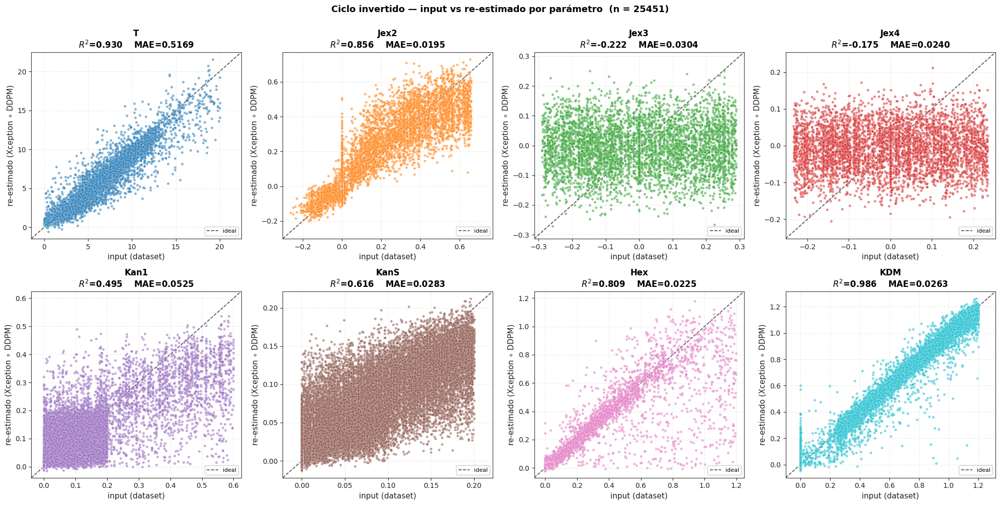

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for i, (ax, name) in enumerate(zip(axes.ravel(), PARAM_NAMES)):
    yt = y_in_phys[:, i]; yp = y_pred_phys[:, i]
    color = PARAM_COLORS[i % len(PARAM_COLORS)]
    ax.scatter(yt, yp, s=14, alpha=0.55, c=color,
               edgecolors="white", linewidths=0.3, zorder=3)
    lo, hi = min(yt.min(), yp.min()), max(yt.max(), yp.max())
    pad = 0.04 * (hi - lo + 1e-9)
    ax.plot([lo - pad, hi + pad], [lo - pad, hi + pad],
            "k--", lw=1.2, alpha=0.7, label="ideal", zorder=2)
    r2_i = r2_score(yt, yp); mae_i = mean_absolute_error(yt, yp)
    ax.set_title(f"{name}\n$R^2$={r2_i:.3f}    MAE={mae_i:.4f}")
    ax.set_xlabel("input (dataset)")
    ax.set_ylabel("re-estimado (Xception ∘ DDPM)")
    ax.legend(loc="lower right", fontsize=8)
    ax.set_xlim(lo - pad, hi + pad); ax.set_ylim(lo - pad, hi + pad)
fig.suptitle(f"Ciclo invertido — input vs re-estimado por parámetro  "
             f"(n = {len(eval_idx)})", y=1.0)
plt.tight_layout()
plt.savefig("inverse_cycle_true_vs_pred.png")
plt.show()


## 13. Metricas de imagen sobre todo el batch

MSE, Var(MSE), SSIM, FFT-MSE, FFT-Corr para cada par (original_40, gen_40). Reportamos media,
mediana, p95 y desviacion.


In [ ]:
rows = []
for k in range(len(eval_idx)):
    a, b = imgs_orig[k], imgs_gen[k]
    fft_d = metric_fft(a, b)
    rows.append({
        "mse":     metric_mse(a, b),
        "mse_var": metric_mse_variance(a, b),
        "ssim":    metric_ssim(a, b),
        "fft_mse": fft_d["mse"],
        "fft_corr":fft_d["corr"],
    })
df_img = pd.DataFrame(rows)

summary_img = pd.DataFrame({
    "Estadistico": ["mean", "median", "p95", "std"],
    "MSE":      [df_img["mse"].mean(), df_img["mse"].median(),
                  df_img["mse"].quantile(0.95), df_img["mse"].std()],
    "Var(MSE)": [df_img["mse_var"].mean(), df_img["mse_var"].median(),
                  df_img["mse_var"].quantile(0.95), df_img["mse_var"].std()],
    "SSIM":     [df_img["ssim"].mean(), df_img["ssim"].median(),
                  df_img["ssim"].quantile(0.95), df_img["ssim"].std()],
    "FFT-MSE":  [df_img["fft_mse"].mean(), df_img["fft_mse"].median(),
                  df_img["fft_mse"].quantile(0.95), df_img["fft_mse"].std()],
    "FFT-Corr": [df_img["fft_corr"].mean(), df_img["fft_corr"].median(),
                  df_img["fft_corr"].quantile(0.95), df_img["fft_corr"].std()],
})
display_df_styled(summary_img,
    title=f"Metricas de imagen (original_40 vs gen_40) — n={len(eval_idx)}",
    num_cols=["MSE", "Var(MSE)", "SSIM", "FFT-MSE", "FFT-Corr"], nd=5)


Estadistico,MSE,Var(MSE),SSIM,FFT-MSE,FFT-Corr
mean,0.29242,0.28002,0.18612,0.00539,0.59932
median,0.31891,0.29116,0.09552,0.00250,0.68022
p95,0.60976,0.62988,0.74829,0.01535,0.98589
std,0.19409,0.22850,0.23323,0.01317,0.30934


## 14. Metricas fisicas (M, |M|, chi, Cv, E) sobre el batch

Para cada par (original_40, gen_40), calculamos las metricas en el disco rd=18.3 y comparamos.
Para `chi` y `Cv` necesitamos `T_phys`, que tomamos del **input** (`y_in_phys[:,0]`).


metrica,"mean(orig, proxy)","mean(gen, ensemble)",MAE,%err_median,R²(orig→gen),n_valid
M,0.0659,0.0685,0.0465,98.7793,0.7197,25451
χ,0.9938,4.4981,6.4714,100.3059,-20.3400,25392
Cv,0.9838,14.0852,13.8840,92.6605,-585.4804,25392
E,-0.4383,-0.4251,0.0580,6.1312,0.8289,25451


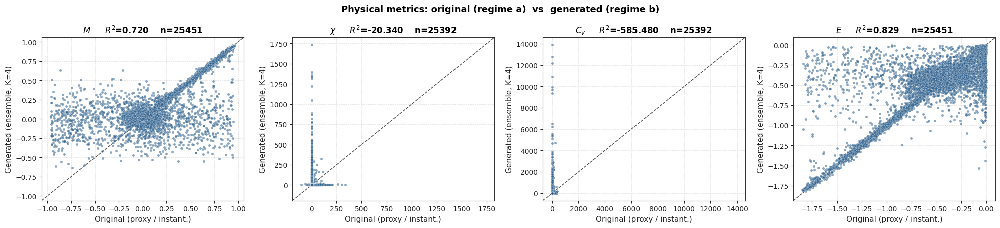

In [ ]:
# =====================================================================
# Metricas fisicas: ORIGINAL vs GENERADA con el MISMO estimador
# =====================================================================
# FIX: la version anterior comparaba phys_orig (regimen a, proxy espacial de UNA
# imagen) contra phys_gen_ens (regimen b, varianza de ensemble). Para M y E
# (momentos de primer orden) da igual, pero chi y Cv son FLUCTUACIONES: el proxy
# espacial y la varianza de ensemble estan en escalas distintas (la de ensemble
# lleva un factor N_M~1052), asi que r2_score(orig, ens) sale pesimo aunque las
# imagenes generadas sean fieles.
#
# Comparacion correcta (apples-to-apples): MISMO estimador en ambos lados. Como
# cada punto original tiene UNA config MC, se aplica el proxy de regimen (a)
# tambien a las generadas. Se prefiere phys_gen_proxy (proxy promediado sobre K,
# baja varianza) si existe; si no, phys_gen (proxy del representante). El valor
# termodinamico de ensemble (phys_gen_ens) se conserva como columna de referencia.

phys_keys   = ["M", "chi", "Cv", "E"]
phys_labels = ["$M$", r"$\chi$", "$C_v$", "$E$"]
display_labels = {"M": "M", "chi": "χ", "Cv": "Cv", "E": "E"}

if "phys_gen_proxy" in globals():
    phys_gen_cmp = phys_gen_proxy; cmp_kind = f"proxy K-prom. (K_PROXY={min(globals().get('K_PROXY', K_ENS), K_ENS)})"
else:
    phys_gen_cmp = phys_gen;       cmp_kind = "proxy (representante)"
print(f"Comparando original (proxy regimen a) vs generada ({cmp_kind}) — mismo estimador.")

rows = []
for k in phys_keys:
    o = phys_orig[k]; g = phys_gen_cmp[k]
    valid = np.isfinite(o) & np.isfinite(g)
    o_v, g_v = o[valid], g[valid]
    if len(o_v) < 2:
        rows.append({"metrica": display_labels[k], "n_valid": len(o_v)})
        continue
    err = np.abs(g_v - o_v)
    denom = np.maximum(np.abs(o_v), 1e-12)
    rel = 100 * err / denom
    g_ens = phys_gen_ens[k][valid]
    rows.append({
        "metrica":              display_labels[k],
        "mean(orig, proxy)":    o_v.mean(),
        "mean(gen, proxy)":     g_v.mean(),
        "mean(gen, ensemble)":  float(np.nanmean(g_ens)) if np.isfinite(g_ens).any() else np.nan,
        "MAE":                  err.mean(),
        "%err_median":          np.median(rel),
        "R²(orig→gen)":         r2_score(o_v, g_v) if np.var(o_v) > 0 else np.nan,
        "n_valid":              int(valid.sum()),
    })
df_phys_summary = pd.DataFrame(rows)
display_df_styled(df_phys_summary,
    title=(f"Metricas fisicas: original vs generada con MISMO estimador (proxy regimen a)  "
           f"—  n={len(eval_idx)}  (ensemble K={K_ENS} como referencia)"),
    num_cols=["mean(orig, proxy)", "mean(gen, proxy)", "mean(gen, ensemble)", "MAE",
              "%err_median", "R²(orig→gen)", "n_valid"],
    color_col="%err_median", thresholds=(10, 30), nd=4)

fig, axes = plt.subplots(1, len(phys_keys), figsize=(5.0 * len(phys_keys), 4.6))
for ax, k, lbl in zip(axes, phys_keys, phys_labels):
    o = phys_orig[k]; g = phys_gen_cmp[k]
    valid = np.isfinite(o) & np.isfinite(g)
    o_v, g_v = o[valid], g[valid]
    ax.scatter(o_v, g_v, s=14, alpha=0.55, c=COLOR_ORIG,
               edgecolors="white", linewidths=0.3, zorder=3)
    if len(o_v) >= 2:
        lo, hi = min(o_v.min(), g_v.min()), max(o_v.max(), g_v.max())
        pad = 0.05 * (hi - lo + 1e-9)
        ax.plot([lo - pad, hi + pad], [lo - pad, hi + pad],
                "k--", lw=1.1, alpha=0.7, zorder=2)
        r2_v = r2_score(o_v, g_v) if np.var(o_v) > 0 else float("nan")
        ax.set_title(f"{lbl}     $R^2$={r2_v:.3f}    n={valid.sum()}")
        ax.set_xlim(lo - pad, hi + pad); ax.set_ylim(lo - pad, hi + pad)
    else:
        ax.set_title(lbl)
    ax.set_xlabel("Original (proxy regimen a)")
    ax.set_ylabel(f"Generated ({cmp_kind})")
fig.suptitle("Physical metrics: original vs generated — MISMO estimador (proxy regimen a)")
plt.tight_layout()
plt.savefig("inverse_cycle_physics.png")
plt.show()


## 15. Galeria de imagenes originales vs generadas

12 ejemplos aleatorios del batch evaluado. Cada fila: original | generada | |diff|.


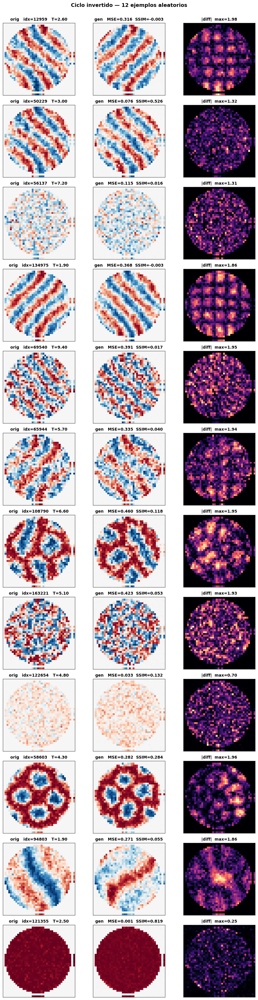

In [ ]:
N_SHOW = 12
sel = np.random.RandomState(0).choice(len(eval_idx), N_SHOW, replace=False)

fig, axes = plt.subplots(N_SHOW, 3, figsize=(10, 2.9 * N_SHOW))
for row, k in enumerate(sel):
    a = imgs_orig[k]; b = imgs_gen[k]; d = np.abs(a - b)
    T_p = y_in_phys[k, 0]
    mse_k = metric_mse(a, b); ssim_k = metric_ssim(a, b)
    axes[row, 0].imshow(a, cmap="RdBu_r", vmin=-1, vmax=1)
    axes[row, 0].set_title(f"orig   idx={eval_idx[k]}   T={T_p:.2f}", fontsize=10)
    axes[row, 1].imshow(b, cmap="RdBu_r", vmin=-1, vmax=1)
    axes[row, 1].set_title(f"gen   MSE={mse_k:.3f}  SSIM={ssim_k:.3f}", fontsize=10)
    axes[row, 2].imshow(d, cmap="magma", vmin=0, vmax=max(d.max(), 1e-6))
    axes[row, 2].set_title(f"|diff|  max={d.max():.2f}", fontsize=10)
    for ax in axes[row]:
        ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
fig.suptitle(f"Ciclo invertido — {N_SHOW} ejemplos aleatorios", y=1.001)
plt.tight_layout()
plt.savefig("inverse_cycle_gallery.png")
plt.show()


## 16. Resumen exportable

CSV con todas las metricas globales del ciclo invertido para guardar/comparar entre runs.


In [ ]:
df_global = df_reg.merge(df_rel, on="param").merge(df_acc, on="param")
df_global.to_csv("inverse_cycle_params_metrics.csv", index=False)
df_phys_summary.to_csv("inverse_cycle_physics_metrics.csv", index=False)
summary_img.to_csv("inverse_cycle_image_metrics.csv", index=False)

display_df_styled(df_global,
    title="inverse_cycle_params_metrics.csv (guardado)",
    num_cols=[c for c in df_global.columns if c != "param"], nd=3)
print("Archivos guardados:")
print("  - inverse_cycle_params_metrics.csv")
print("  - inverse_cycle_physics_metrics.csv")
print("  - inverse_cycle_image_metrics.csv")


param,MAE,RMSE,R2,range_in,nMAE_%,%err_mean,%err_median,%err_p95,%muestras_true~0,%err_median_clean,%acierto (|err|<=10%)
T,0.517,0.842,0.930,20.000,2.585,18.522,10.527,50.239,0.499,10.471,47.664
Jex2,0.020,0.053,0.856,0.921,2.120,44.289,21.696,96.818,82.016,30.383,24.950
Jex3,0.030,0.080,-0.222,0.580,5.233,53.788,21.251,163.985,81.914,105.579,26.753
Jex4,0.024,0.063,-0.175,0.469,5.108,56.214,24.358,166.391,81.867,104.364,22.537
Kan1,0.052,0.078,0.495,0.600,8.751,133.304,43.656,608.652,20.510,44.116,12.086
KanS,0.028,0.039,0.616,0.200,14.143,147.512,38.070,595.806,18.082,32.030,14.074
Hex,0.022,0.075,0.809,1.199,1.875,52.865,34.863,176.937,34.344,30.128,15.756
KDM,0.026,0.046,0.986,1.200,2.189,27.850,3.505,134.247,18.435,2.684,75.636


Archivos guardados:
  - inverse_cycle_params_metrics.csv
  - inverse_cycle_physics_metrics.csv
  - inverse_cycle_image_metrics.csv


## 17. Estadisticas por cluster

El dataset esta organizado en `K` clusters etiquetados en `labels`. Cada cluster
agrupa configuraciones con una estructura magnetica determinada (vortices, dominios,
estados ferromagneticos, fases helicoidales, etc.). Aqui desagregamos las metricas
del ciclo invertido por cluster:

- Conteo de muestras por cluster (en el batch de evaluacion).
- MAE, R² y % acierto **por parametro y por cluster**.
- Promedio de metricas de imagen (MSE, SSIM, FFT-corr) **por cluster**.
- Promedio y MAE de metricas fisicas (M, |M|, χ, Cv, E) **por cluster**.

Si las metricas se ven mal en un cluster especifico, es senal de que el DDPM o el
Xception tienen dificultad con esa estructura en particular.

Clusters presentes en el batch eval (n=25451):


cluster,n_muestras_eval,%_del_eval,n_total_dataset
4.0,5527.00,21.72,36611.00
5.0,9227.00,36.25,61670.00
6.0,2934.00,11.53,19320.00
8.0,923.00,3.63,6079.00
10.0,2246.00,8.82,15584.00
11.0,1147.00,4.51,7731.00
12.0,408.00,1.60,2680.00
13.0,458.00,1.80,3059.00
14.0,49.00,0.19,350.00
15.0,560.00,2.20,3667.00


cluster,param,n,MAE,R2,%err_median,%acierto
4,T,5527,0.330,0.974,8.552,57.843
4,Jex2,5527,0.002,—,16.380,31.753
4,Jex3,5527,0.001,—,8.396,57.662
4,Jex4,5527,0.001,—,8.149,59.182
4,Kan1,5527,0.053,-0.232,46.312,10.946
4,KanS,5527,0.033,0.447,33.005,16.374
4,Hex,5527,0.012,-0.031,40.020,11.380
4,KDM,5527,0.022,0.977,2.173,97.883
5,T,9227,0.337,0.973,8.397,58.838
5,Jex2,9227,0.002,—,16.271,32.567


cluster,n,MAE_avg,R2_avg,%err_median_avg,%acierto_avg
4.0,5527.000,0.057,0.427,20.373,42.878
5.0,9227.000,0.058,0.401,20.006,43.062
6.0,2934.000,0.077,0.417,23.889,32.277
8.0,923.000,0.205,-0.487,179.574,5.485
10.0,2246.000,0.158,-10.921,319.948,7.580
11.0,1147.000,0.241,-5.441,239.594,7.629
12.0,408.000,0.181,-25.974,211.938,13.235
13.0,458.000,0.073,0.779,17.740,40.830
14.0,49.000,0.074,0.567,21.112,34.439
15.0,560.000,0.116,0.719,18.710,34.085


cluster,n,MSE_mean,MSE_median,SSIM_mean,SSIM_median,FFTcorr_mean
4.0,5527.0000,0.3304,0.3440,0.1093,0.0467,0.4693
5.0,9227.0000,0.3294,0.3412,0.1882,0.1210,0.6224
6.0,2934.0000,0.3274,0.3312,0.1355,0.0983,0.6403
8.0,923.0000,0.4013,0.4115,0.0814,0.0687,0.6072
10.0,2246.0000,0.0586,0.0383,0.0633,0.0426,0.4038
11.0,1147.0000,0.2700,0.1548,0.0928,0.0478,0.5548
12.0,408.0000,0.4486,0.3422,0.1743,0.1134,0.8443
13.0,458.0000,0.5315,0.5572,0.1692,0.1032,0.5408
14.0,49.0000,0.4422,0.4759,0.2429,0.1781,0.6491
15.0,560.0000,0.2309,0.2031,0.3693,0.3612,0.8306


cluster,metrica,n,"mean(orig,proxy)","mean(gen,ens)",MAE,%err_median,R²
4,M,5527,0.0033,-0.0004,0.0151,113.0779,-0.3996
4,|M|,5527,0.0132,0.0134,0.0089,56.5053,-0.1485
4,χ,5527,-0.3941,0.1049,1.6044,101.1906,-0.1492
4,Cv,5527,0.5224,2.1479,1.7907,68.3020,-43.9143
4,E,5527,-0.3584,-0.3572,0.0307,4.7820,0.2591
5,M,9227,-0.0059,-0.0012,0.0140,105.4455,-0.2792
5,|M|,9227,0.0133,0.0132,0.0087,56.0349,-0.0204
5,χ,9227,-0.2620,0.0830,1.5382,100.3440,-0.0433
5,Cv,9227,0.2887,2.3029,2.0611,73.0012,-220.1995
5,E,9227,-0.3520,-0.3501,0.0264,4.4029,0.3505


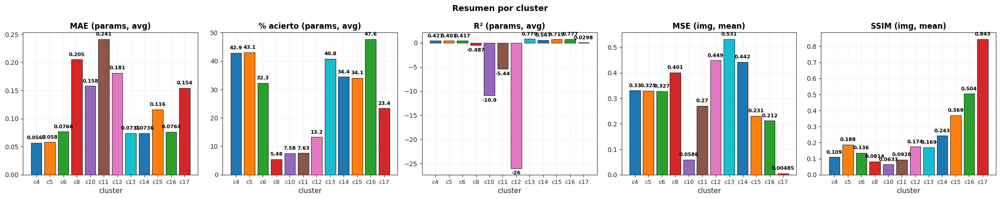

Guardados:
  - inverse_cycle_params_by_cluster.csv
  - inverse_cycle_params_by_cluster_summary.csv
  - inverse_cycle_image_by_cluster.csv
  - inverse_cycle_physics_by_cluster.csv


In [ ]:
# =====================================================================
# Estadisticas por cluster (parametros + fisicas regimen-a vs regimen-b)
# Actualizada para comparar: phys_orig (proxy) vs phys_gen_ens (ensemble).
# =====================================================================
if labels is None:
    print("labels no disponible: saltando analisis por cluster.")
else:
    eval_labels = labels[eval_idx]
    cluster_ids_in_eval = np.unique(eval_labels).tolist()
    print(f"Clusters presentes en el batch eval (n={len(eval_idx)}):")
    rows_cnt = []
    for cid in cluster_ids_in_eval:
        mask_c = (eval_labels == cid)
        rows_cnt.append({
            "cluster": int(cid),
            "n_muestras_eval": int(mask_c.sum()),
            "%_del_eval":      100 * mask_c.mean(),
            "n_total_dataset": int((labels == cid).sum()),
        })
    df_cnt = pd.DataFrame(rows_cnt)
    display_df_styled(df_cnt, title="Distribucion de clusters en el batch de evaluacion",
        num_cols=["n_muestras_eval", "%_del_eval", "n_total_dataset"], nd=2)


# =====================================================================
# A) Metricas de parametros por cluster
# =====================================================================
if labels is not None:
    def cluster_param_metrics(y_true, y_pred, lab, names, acc_thr=10.0,
                              eps_rel_frac=EPS_REL_FRAC):
        rows = []
        for cid in np.unique(lab):
            m_c = (lab == cid)
            n_c = int(m_c.sum())
            if n_c < 2:
                continue
            for i, name in enumerate(names):
                yt = y_true[m_c, i]; yp = y_pred[m_c, i]
                rng_p = yt.max() - yt.min()
                eps_abs = eps_rel_frac * (rng_p if rng_p > 0 else 1.0)
                denom = np.maximum(np.abs(yt), eps_abs)
                rel = 100 * np.abs(yp - yt) / denom
                mae_i = mean_absolute_error(yt, yp)
                r2_i  = r2_score(yt, yp) if np.var(yt) > 1e-12 else np.nan
                rows.append({
                    "cluster":     int(cid),
                    "param":       name,
                    "n":           n_c,
                    "MAE":         mae_i,
                    "R2":          r2_i,
                    "%err_median": np.median(rel),
                    f"%acierto":   100 * (rel <= acc_thr).mean(),
                })
        return pd.DataFrame(rows)

    df_par_cluster = cluster_param_metrics(
        y_in_phys, y_pred_phys, eval_labels, PARAM_NAMES,
        acc_thr=ACC_THRESHOLD, eps_rel_frac=EPS_REL_FRAC)
    display_df_styled(df_par_cluster,
        title=f"Metricas de parametros por (cluster, param)   "
              f"acierto: |err|<={ACC_THRESHOLD:.0f}%",
        num_cols=["n", "MAE", "R2", "%err_median", "%acierto"],
        color_col="%err_median", thresholds=(5, 20), nd=3)

    rows_sum = []
    for cid in df_par_cluster["cluster"].unique():
        sub = df_par_cluster[df_par_cluster["cluster"] == cid]
        rows_sum.append({
            "cluster":          int(cid),
            "n":                int(sub["n"].iloc[0]),
            "MAE_avg":          sub["MAE"].mean(),
            "R2_avg":           sub["R2"].mean(),
            "%err_median_avg":  sub["%err_median"].mean(),
            "%acierto_avg":     sub["%acierto"].mean(),
        })
    df_par_clu_summary = pd.DataFrame(rows_sum)
    display_df_styled(df_par_clu_summary,
        title="Resumen por cluster (promedio sobre los 8 parametros)",
        num_cols=["n","MAE_avg","R2_avg","%err_median_avg","%acierto_avg"],
        color_col="%err_median_avg", thresholds=(5, 20), nd=3)


# =====================================================================
# B) Metricas de imagen por cluster (usa el representante DDPM)
# =====================================================================
if labels is not None:
    img_metrics_per_sample = []
    for k in range(len(eval_idx)):
        a, b = imgs_orig[k], imgs_gen[k]
        fft_d = metric_fft(a, b)
        img_metrics_per_sample.append({
            "cluster":  int(eval_labels[k]),
            "mse":      metric_mse(a, b),
            "ssim":     metric_ssim(a, b),
            "fft_corr": fft_d["corr"],
        })
    df_img_clu = pd.DataFrame(img_metrics_per_sample)
    df_img_clu_summary = (df_img_clu.groupby("cluster")
        .agg(n=("mse", "size"),
             MSE_mean=("mse", "mean"),    MSE_median=("mse", "median"),
             SSIM_mean=("ssim", "mean"),  SSIM_median=("ssim", "median"),
             FFTcorr_mean=("fft_corr", "mean"))
        .reset_index())
    display_df_styled(df_img_clu_summary,
        title="Metricas de imagen por cluster (representante DDPM vs original)",
        num_cols=["n","MSE_mean","MSE_median","SSIM_mean","SSIM_median","FFTcorr_mean"],
        nd=4)


# =====================================================================
# C) Metricas fisicas por cluster:  orig (proxy)  vs  gen (ensemble)
# =====================================================================
if labels is not None:
    rows_phys_clu = []
    for cid in cluster_ids_in_eval:
        m_c = (eval_labels == cid)
        n_c = int(m_c.sum())
        for k in ["M","absM","chi","Cv","E"]:
            o = phys_orig[k][m_c]; g = phys_gen_ens[k][m_c]
            valid = np.isfinite(o) & np.isfinite(g)
            o_v, g_v = o[valid], g[valid]
            if len(o_v) < 2:
                continue
            err = np.abs(g_v - o_v)
            denom = np.maximum(np.abs(o_v), 1e-12)
            rel = 100 * err / denom
            r2_v = r2_score(o_v, g_v) if np.var(o_v) > 1e-12 else np.nan
            rows_phys_clu.append({
                "cluster":          int(cid),
                "metrica":          {"absM":"|M|","chi":"χ"}.get(k, k),
                "n":                len(o_v),
                "mean(orig,proxy)": o_v.mean(),
                "mean(gen,ens)":    g_v.mean(),
                "MAE":              err.mean(),
                "%err_median":      np.median(rel),
                "R²":               r2_v,
            })
    df_phys_clu = pd.DataFrame(rows_phys_clu)
    display_df_styled(df_phys_clu,
        title=("Metricas fisicas por (cluster, metrica)   "
               f"K_ENS={K_ENS}   orig=proxy/instant.   gen=ensemble"),
        num_cols=["n","mean(orig,proxy)","mean(gen,ens)","MAE","%err_median","R²"],
        color_col="%err_median", thresholds=(10, 30), nd=4)


# =====================================================================
# D) Figura: barras comparando clusters
# =====================================================================
if labels is not None and len(cluster_ids_in_eval) >= 2:
    ids = [int(c) for c in cluster_ids_in_eval]
    x_pos = np.arange(len(ids))
    mae_avg   = [df_par_clu_summary.loc[
        df_par_clu_summary["cluster"]==c, "MAE_avg"].iloc[0] for c in ids]
    acc_avg   = [df_par_clu_summary.loc[
        df_par_clu_summary["cluster"]==c, "%acierto_avg"].iloc[0] for c in ids]
    r2_avg    = [df_par_clu_summary.loc[
        df_par_clu_summary["cluster"]==c, "R2_avg"].iloc[0] for c in ids]
    mse_mean  = [df_img_clu_summary.loc[
        df_img_clu_summary["cluster"]==c, "MSE_mean"].iloc[0] for c in ids]
    ssim_mean = [df_img_clu_summary.loc[
        df_img_clu_summary["cluster"]==c, "SSIM_mean"].iloc[0] for c in ids]

    fig, axes = plt.subplots(1, 5, figsize=(22, 4.4))
    titles = ["MAE (params, avg)", "% acierto (params, avg)",
              "R² (params, avg)", "MSE (img, mean)", "SSIM (img, mean)"]
    data   = [mae_avg, acc_avg, r2_avg, mse_mean, ssim_mean]
    colors = [PARAM_COLORS[i % len(PARAM_COLORS)] for i in range(len(ids))]
    for ax, title, vals in zip(axes, titles, data):
        bars = ax.bar(x_pos, vals, color=colors,
                      edgecolor="#222", linewidth=0.7, zorder=3)
        ax.set_xticks(x_pos)
        ax.set_xticklabels([f"c{c}" for c in ids], fontsize=9)
        ax.set_title(title)
        ymax = max(abs(v) for v in vals) or 1.0
        for bar, v in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width()/2,
                    bar.get_height() + np.sign(bar.get_height()) * 0.02 * ymax,
                    f"{v:.3g}", ha="center",
                    va="bottom" if bar.get_height() >= 0 else "top",
                    fontsize=8, fontweight="bold")
        ax.set_xlabel("cluster")
    fig.suptitle("Resumen por cluster")
    plt.tight_layout()
    plt.savefig("inverse_cycle_per_cluster_summary.png")
    plt.show()


# =====================================================================
# E) Exportar CSVs por cluster
# =====================================================================
if labels is not None:
    df_par_cluster.to_csv("inverse_cycle_params_by_cluster.csv", index=False)
    df_par_clu_summary.to_csv("inverse_cycle_params_by_cluster_summary.csv", index=False)
    df_img_clu_summary.to_csv("inverse_cycle_image_by_cluster.csv", index=False)
    df_phys_clu.to_csv("inverse_cycle_physics_by_cluster.csv", index=False)
    print("Guardados:")
    print("  - inverse_cycle_params_by_cluster.csv")
    print("  - inverse_cycle_params_by_cluster_summary.csv")
    print("  - inverse_cycle_image_by_cluster.csv")
    print("  - inverse_cycle_physics_by_cluster.csv")


## 19. R² y MAE por cluster con galerías y vista por métrica

Para cada **cluster** evaluamos, sobre el subconjunto del **test set** que cayó en él durante el batch (`eval_idx`, `eval_labels`):

- **Parámetros** (8): `T, Jex2, Jex3, Jex4, Kan1, KanS, Hex, KDM` — valor *original* (entrada del DDPM) vs valor *re-estimado* por el Xception sobre la imagen generada representante.
- **Métricas físicas** (4, sin `|M|`): `M, χ, Cv, E` — para cada punto del test comparamos:
  - **Origen** $\to$ régimen (a) del artículo: la única configuración Monte Carlo disponible; $M$ y $E$ como estimadores espaciales instantáneos, $\chi$ y $C_v$ como **proxies espaciales** (regla de suma FDT por Wiener–Khinchin y método de subsistema de Binder).
  - **Generadas** $\to$ régimen (b): un ensemble de $K=$ `K_ENS` muestras DDPM con los mismos parámetros; $\langle M\rangle, \langle E\rangle$ como medias de ensemble, y $\chi$ y $C_v$ por las **definiciones termodinámicas directas** (varianza del ensemble).

El R² y MAE así calculados son una **calibración interna** (artículo §3.3): miden cuánto coinciden los proxies espaciales (sobre la imagen MC) con los estimadores termodinámicos de ensemble (sobre las generadas) — un acuerdo alto evidencia que el proxy es buen sustituto cuando no hay ensemble disponible.

### Fórmulas

Las observables se evalúan sobre el disco del nanodot $\mathcal{D}$ (radio $r_d = 18.3$ px, $N = |\mathcal{D}|$).

**Magnetización $M$**

Régimen (a) — una sola imagen MC:
$$
M^{\text{orig}}\;=\;\frac{1}{N}\sum_{i\in\mathcal{D}} s^{\text{orig}}_z(i).
\qquad\text{(Eq. 26 del artículo)}
$$

Régimen (b) — ensemble de $K$ imágenes DDPM:
$$
\langle M\rangle^{\text{gen}}\;=\;\frac{1}{K}\sum_{k=1}^{K}\!\left[\frac{1}{N}\sum_{i\in\mathcal{D}} s^{(k)}_z(i)\right].
\qquad\text{(Eq. 27)}
$$

**Susceptibilidad $\chi$**

Régimen (a) — proxy espacial vía regla de suma FDT (Wiener–Khinchin), con cutoff radial $r_c = r_d/2$:
$$
\chi^{\text{orig}}\;=\;\frac{1}{T}\sum_{|\mathbf{r}|\le r_c} G(\mathbf{r}),
\qquad
G(\mathbf{r}) \;=\; \mathcal{F}^{-1}\!\bigl(|\mathcal{F}(s_c)|^{2}\bigr)/N,\quad s_c=(s-\bar s)\,\mathbb{1}_{\mathcal{D}}.
\qquad\text{(Eq. 30)}
$$

Régimen (b) — definición termodinámica directa sobre el ensemble:
$$
\chi^{\text{gen}}\;=\;\frac{N}{T}\bigl(\langle M^{2}\rangle_{\text{ens}}-\langle M\rangle^{2}_{\text{ens}}\bigr).
\qquad\text{(Eq. 31)}
$$

**Calor específico $C_v$**

Régimen (a) — proxy de subsistema de Binder sobre bloques completos $5\times 5$:
$$
C_v^{\text{orig}}\;=\;\frac{|B|}{T^{2}}\bigl(\langle \varepsilon^{2}\rangle_B-\langle \varepsilon\rangle_B^{2}\bigr),
\qquad
\varepsilon_k = -\frac{1}{|B|}\!\sum_{\langle i,j\rangle\in B_k} s_i s_j.
\qquad\text{(Eqs. 34–35)}
$$

Régimen (b) — definición termodinámica directa sobre el ensemble:
$$
C_v^{\text{gen}}\;=\;\frac{N}{T^{2}}\bigl(\langle E^{2}\rangle_{\text{ens}}-\langle E\rangle^{2}_{\text{ens}}\bigr).
\qquad\text{(Eq. 36)}
$$

**Densidad de energía $E$**

Régimen (a):
$$
E^{\text{orig}}\;=\;-\frac{1}{N}\sum_{\langle i,j\rangle\in\mathcal{D}} s^{\text{orig}}_z(i)\,s^{\text{orig}}_z(j).
\qquad\text{(Eq. 32)}
$$

Régimen (b):
$$
\langle E\rangle^{\text{gen}}\;=\;-\frac{1}{K}\sum_{k=1}^{K}\!\left[\frac{1}{N}\sum_{\langle i,j\rangle\in\mathcal{D}} s^{(k)}_z(i)\,s^{(k)}_z(j)\right].
\qquad\text{(Eq. 33)}
$$

### Galerías

En la **vista por cluster** se incluyen 5 imágenes aleatorias del cluster (`cmap='jet'`) encima de la fila de medidas. En la **vista por métrica/parámetro** no se incluyen imágenes (todos los clusters como subplots side-by-side).


In [ ]:
# =====================================================================
# 19.A — Recolectar R² y MAE por cluster
#         Parametros: y_in_phys vs y_pred_phys
#         Fisicas:    phys_orig (regimen a, proxy) vs phys_gen_ens (regimen b, ensemble)
# =====================================================================
assert labels is not None, "Esta seccion requiere 'labels' en el dataset."

cluster_ids_eval = sorted(int(c) for c in np.unique(eval_labels))

# Sin |M| en las nuevas graficas (decision de proyecto).
PHYS_KEYS_USE  = ["M", "chi", "Cv", "E"]
PHYS_LABEL_EN  = {"M": "M", "chi": "chi", "Cv": "Cv", "E": "E"}
PHYS_LABEL_TEX = {"M": "$M$", "chi": r"$\chi$", "Cv": "$C_v$", "E": "$E$"}

def _safe_r2(yt, yp):
    yt = np.asarray(yt, dtype=np.float64); yp = np.asarray(yp, dtype=np.float64)
    if yt.size < 2 or np.var(yt) < 1e-12:
        return float("nan")
    return float(r2_score(yt, yp))

def _safe_mae(yt, yp):
    yt = np.asarray(yt, dtype=np.float64); yp = np.asarray(yp, dtype=np.float64)
    if yt.size < 1:
        return float("nan")
    return float(mean_absolute_error(yt, yp))

PARAM_KIND = "param"
PHYS_KIND  = "phys"
MEASURES = (
    [(PARAM_KIND, i, name, name) for i, name in enumerate(PARAM_NAMES)]
    + [(PHYS_KIND, None, k, PHYS_LABEL_EN[k]) for k in PHYS_KEYS_USE]
)
print(f"Total medidas por cluster: {len(MEASURES)}  "
      f"(8 parametros + {len(PHYS_KEYS_USE)} fisicas)")
print(f"Clusters en el batch eval: {cluster_ids_eval}")
print(f"Fisicas: orig=regimen(a) proxy/instant.   gen=regimen(b) ensemble K={K_ENS}")

cluster_data = {}
for cid in cluster_ids_eval:
    m_c = (eval_labels == cid)
    n_c = int(m_c.sum())
    cluster_data[cid] = {"_n": n_c, "_mask": m_c}
    # Parametros (original vs predicho por Xception)
    for i, pname in enumerate(PARAM_NAMES):
        yt = y_in_phys[m_c, i]
        yp = y_pred_phys[m_c, i]
        cluster_data[cid][pname] = dict(
            kind=PARAM_KIND, y_true=yt, y_pred=yp,
            r2=_safe_r2(yt, yp), mae=_safe_mae(yt, yp),
            title=pname,
        )
    # Fisicas: regimen (a) original vs regimen (b) generadas
    for k in PHYS_KEYS_USE:
        o = phys_orig[k][m_c]
        g = phys_gen_ens[k][m_c]
        valid = np.isfinite(o) & np.isfinite(g)
        ov, gv = o[valid], g[valid]
        cluster_data[cid][k] = dict(
            kind=PHYS_KIND, y_true=ov, y_pred=gv,
            r2=_safe_r2(ov, gv), mae=_safe_mae(ov, gv),
            title=PHYS_LABEL_EN[k],
        )

rows_long = []
for cid in cluster_ids_eval:
    for (kind, _i, key, title) in MEASURES:
        d = cluster_data[cid][key]
        rows_long.append({
            "cluster": cid,
            "kind":    kind,
            "measure": title,
            "n":       int(d["y_true"].size),
            "R2":      d["r2"],
            "MAE":     d["mae"],
        })
df_clu_long = pd.DataFrame(rows_long)
display_df_styled(
    df_clu_long.head(20),
    title="R² y MAE por (cluster, medida) — primeras 20 filas",
    num_cols=["n", "R2", "MAE"], nd=4,
)
df_clu_long.to_csv("inverse_cycle_r2_mae_by_cluster.csv", index=False)
print("Guardado: inverse_cycle_r2_mae_by_cluster.csv")


Total medidas por cluster: 12  (8 parametros + 4 fisicas)
Clusters en el batch eval: [4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 17]
Fisicas: orig=regimen(a) proxy/instant.   gen=regimen(b) ensemble K=4


cluster,kind,measure,n,R2,MAE
4,param,T,5527,0.9737,0.3302
4,param,Jex2,5527,—,0.0020
4,param,Jex3,5527,—,0.0011
4,param,Jex4,5527,—,0.0010
4,param,Kan1,5527,-0.2317,0.0526
4,param,KanS,5527,0.4469,0.0327
4,param,Hex,5527,-0.0305,0.0121
4,param,KDM,5527,0.9773,0.0217
4,phys,M,5527,-0.3996,0.0151
4,phys,chi,5527,-0.1492,1.6044


Guardado: inverse_cycle_r2_mae_by_cluster.csv


/tmp/ipykernel_768/168254317.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


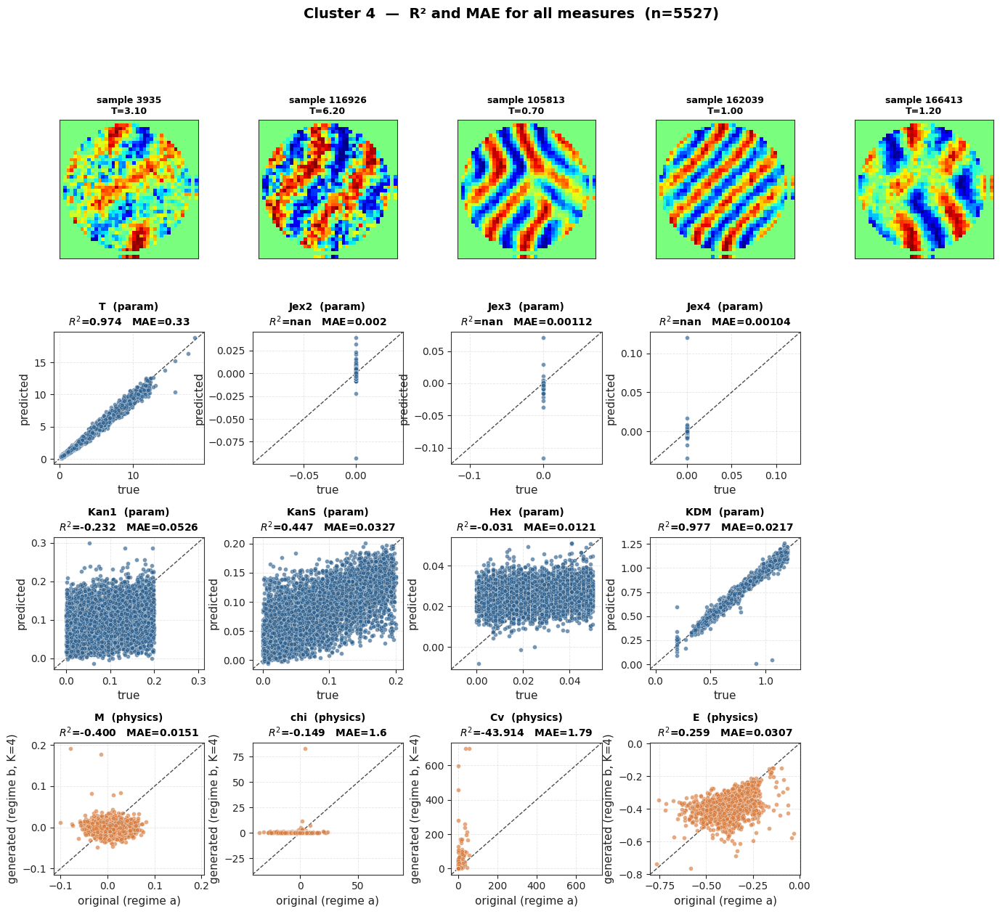

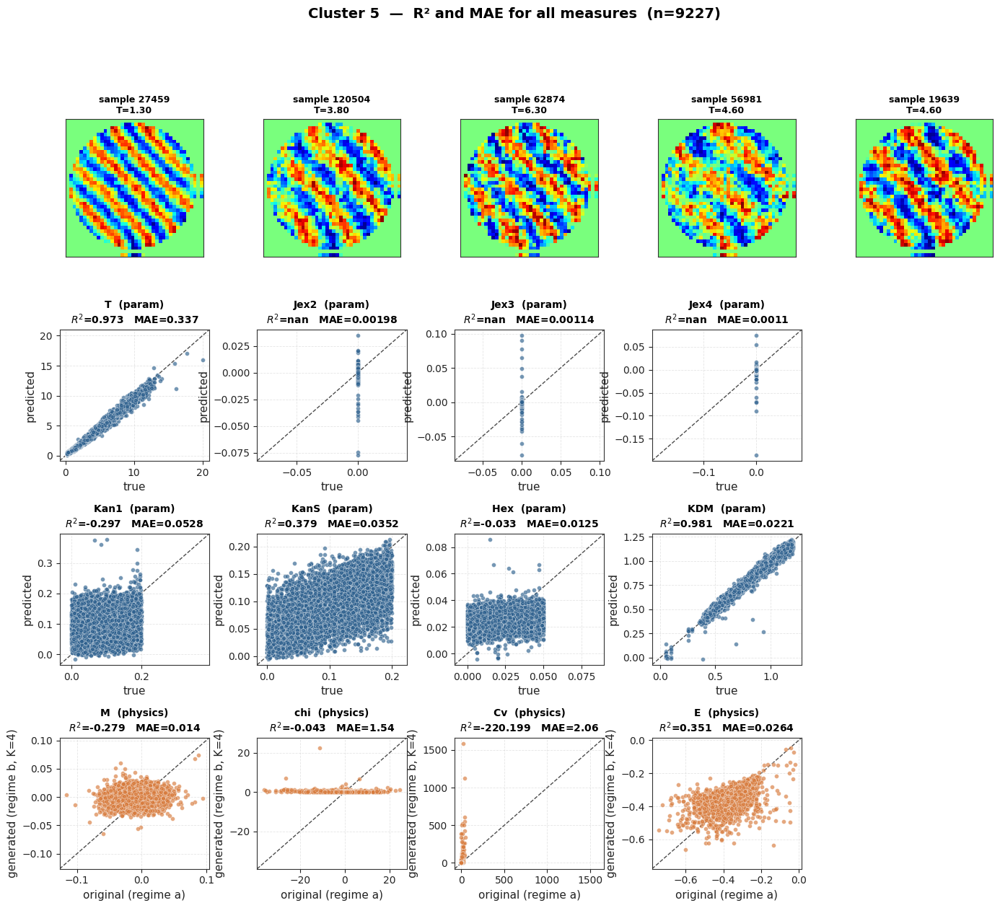

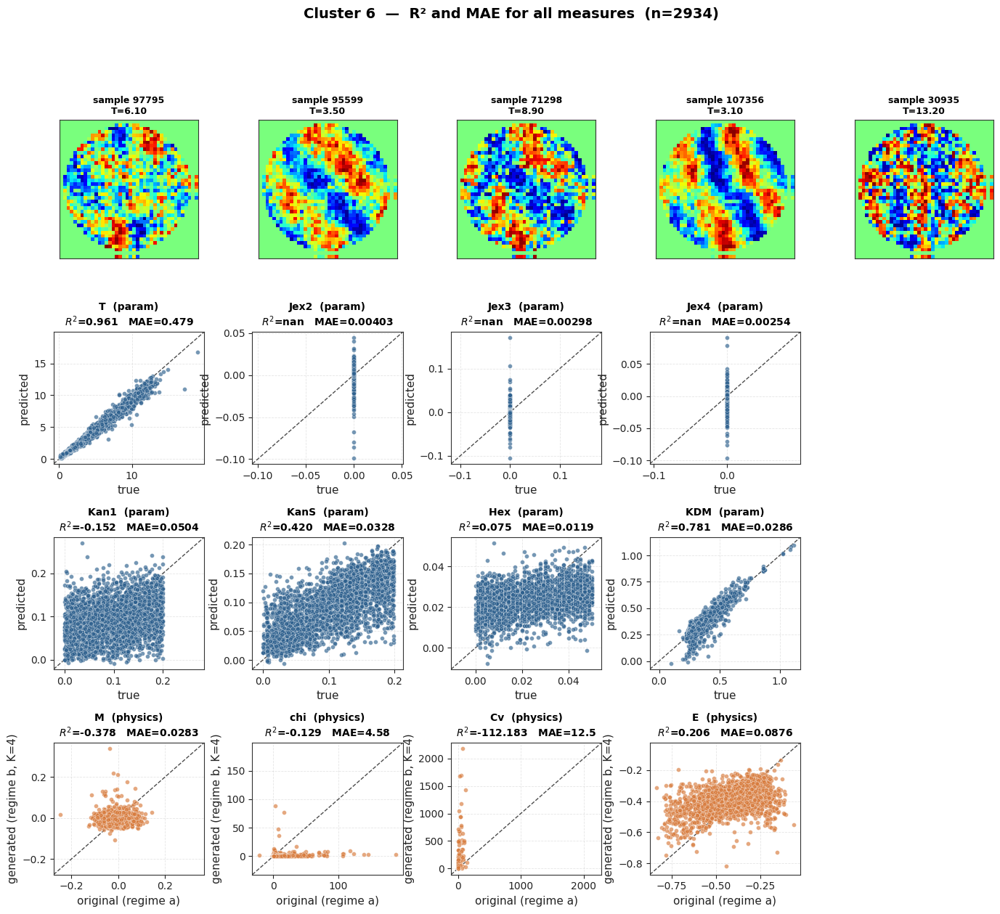

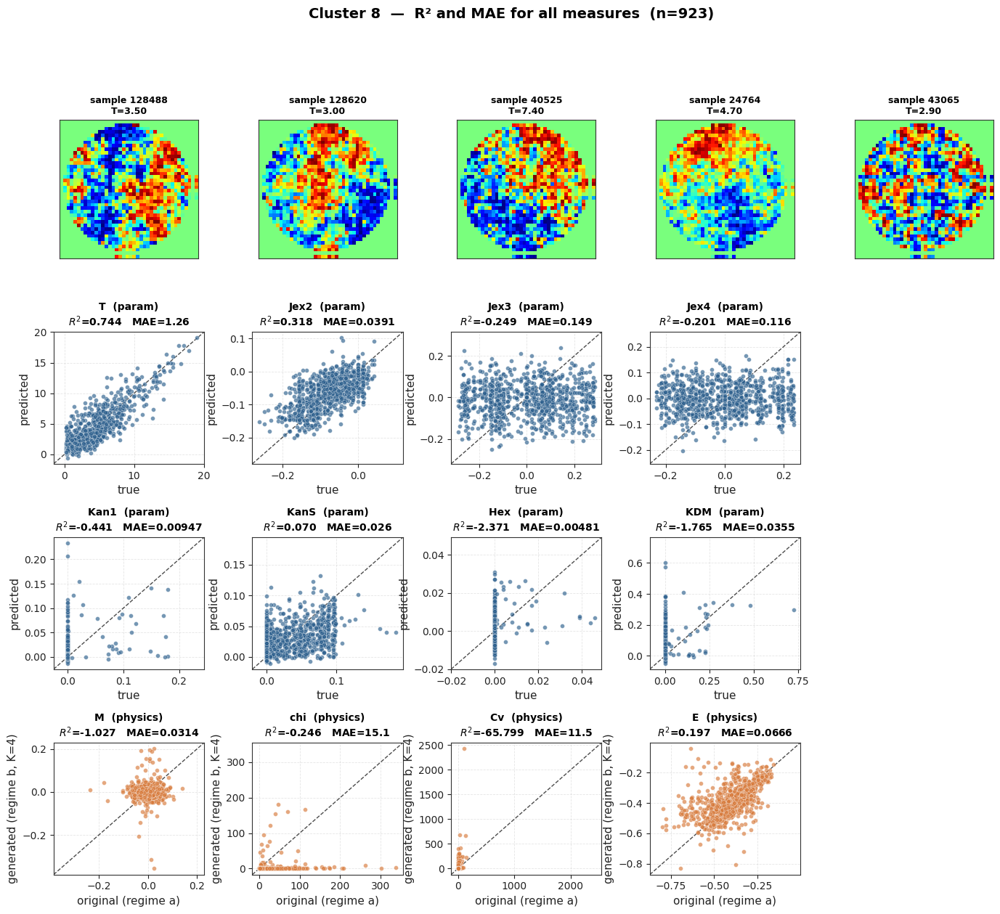

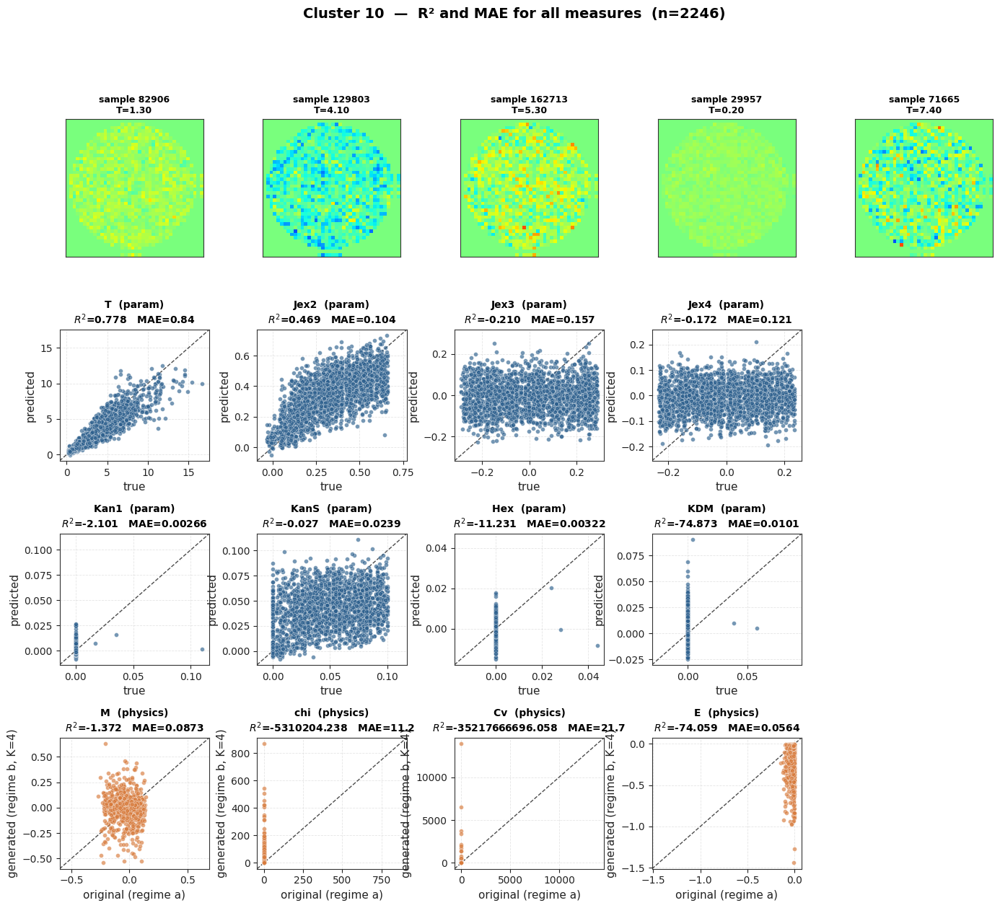

...

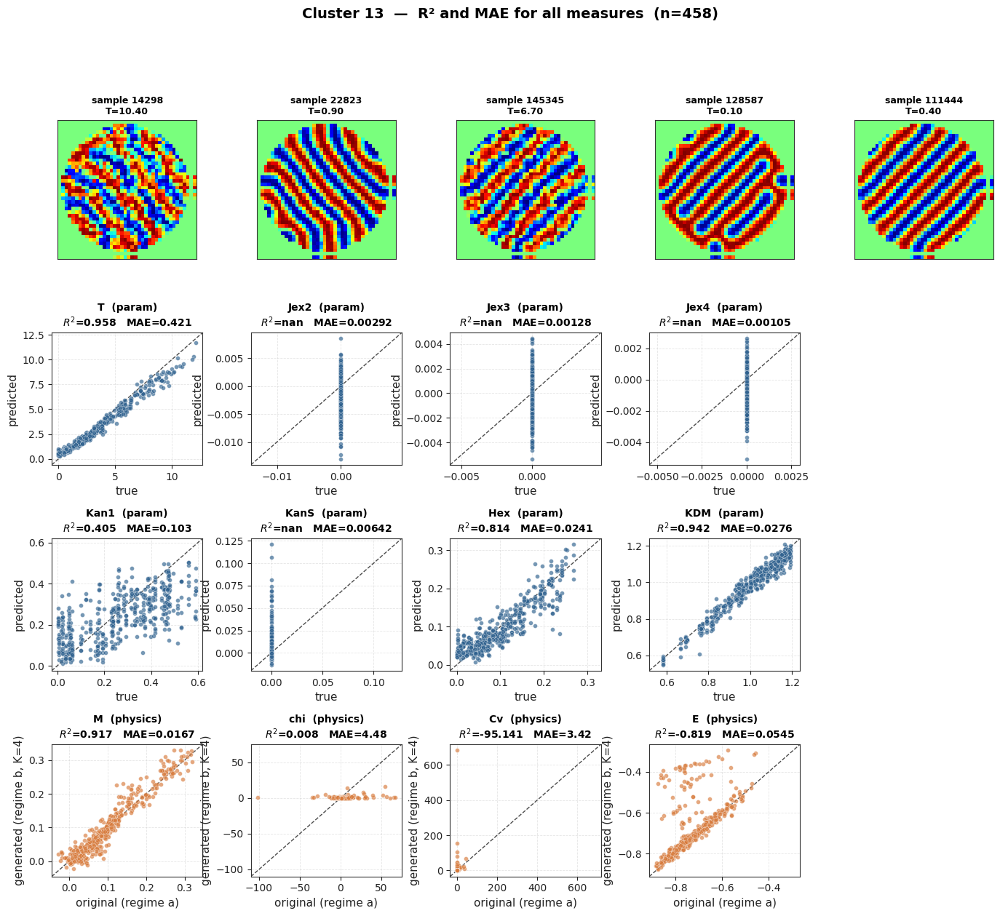

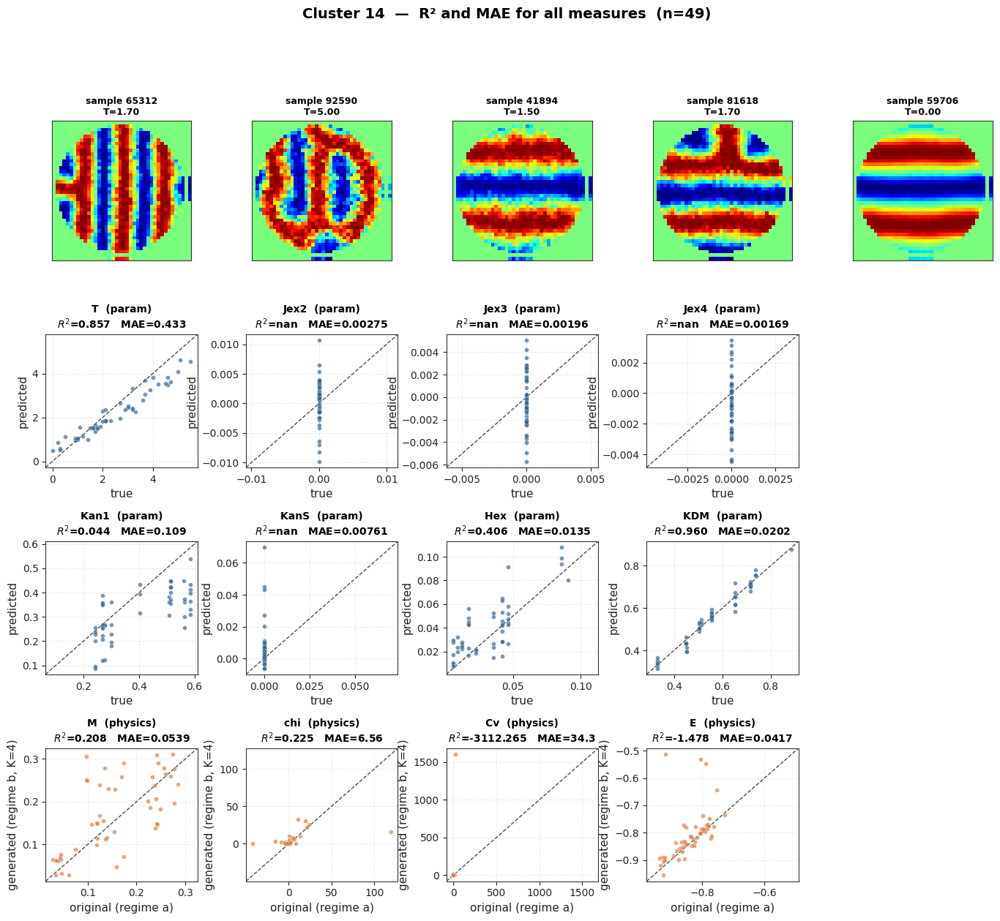

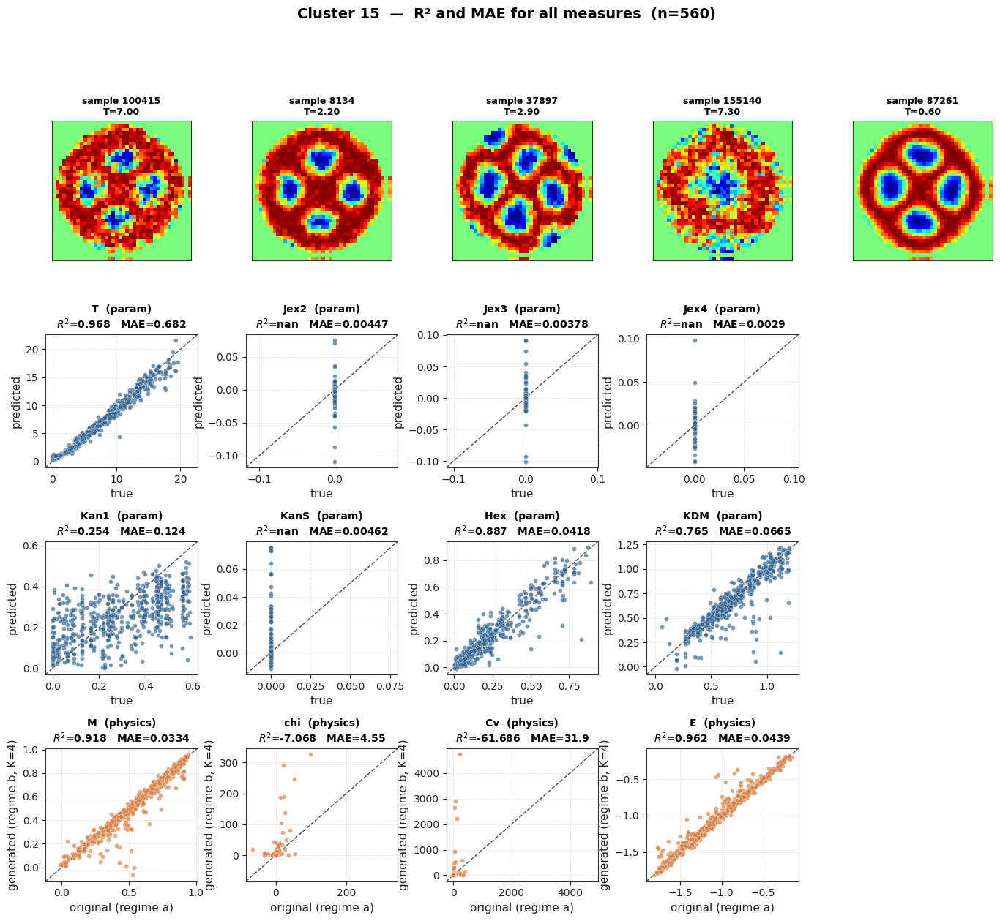

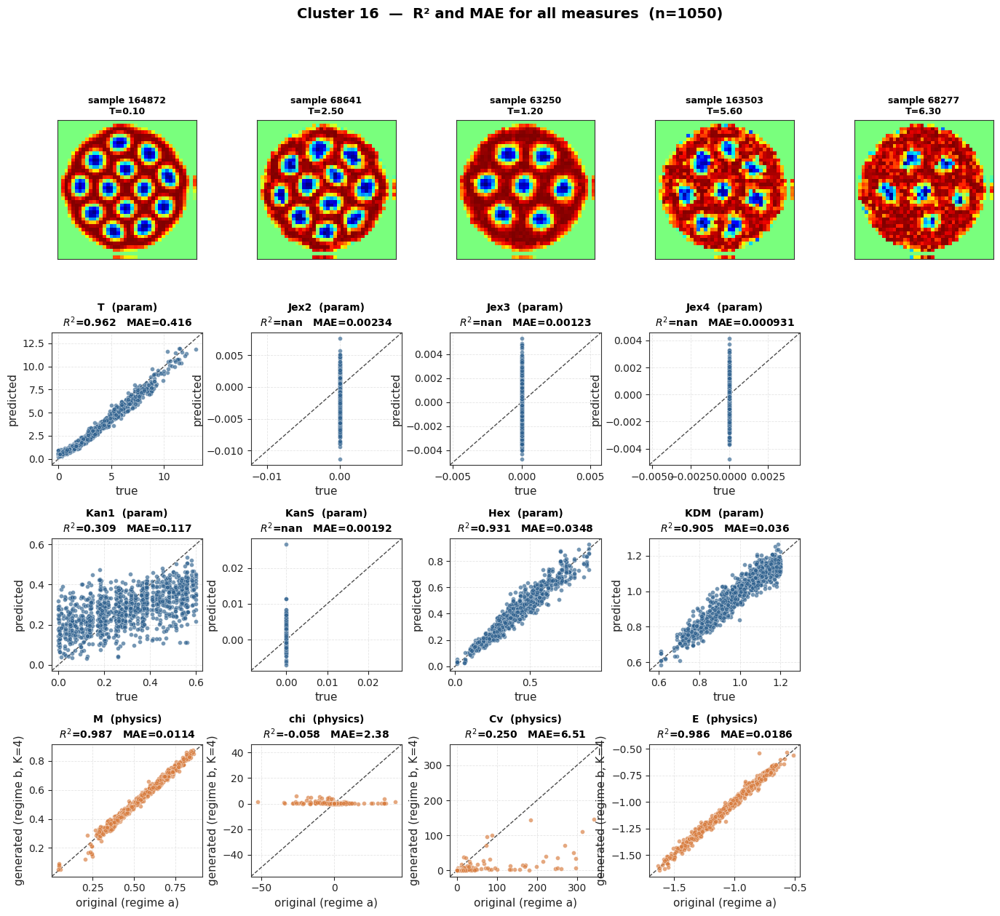

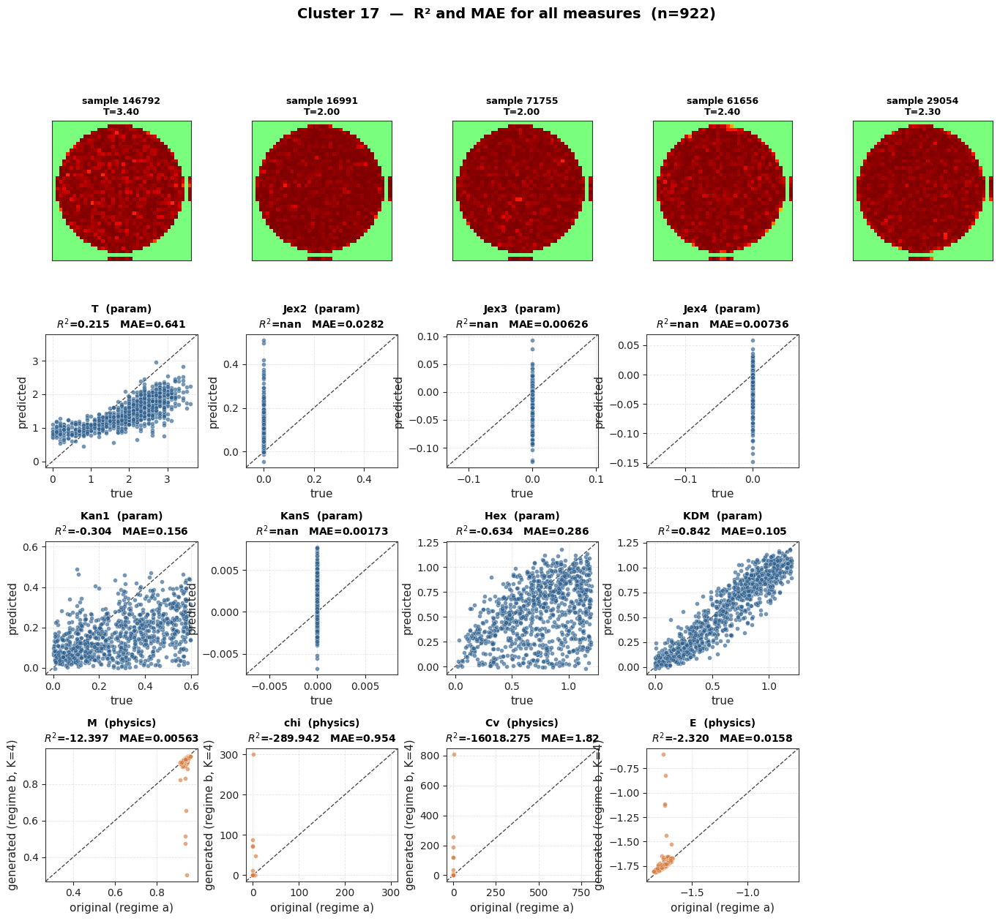

In [ ]:
# =====================================================================
# 19.B — Vista 1: una figura por cluster (todas sus medidas + 5 imagenes)
# =====================================================================
N_IMG_PER_CLUSTER = 5
N_COLS            = 4
IMG_CMAP          = "jet"
rng_gallery       = np.random.RandomState(123)

n_measures_total = len(MEASURES)
n_rows_measures  = int(np.ceil(n_measures_total / N_COLS))

for cid in cluster_ids_eval:
    d_clu = cluster_data[cid]
    m_c   = d_clu["_mask"]
    n_c   = d_clu["_n"]

    pool = np.where(m_c)[0]
    n_pick = min(N_IMG_PER_CLUSTER, len(pool))
    sel = rng_gallery.choice(pool, n_pick, replace=False)

    fig = plt.figure(figsize=(4.2 * N_COLS, 3.0 + 3.5 * n_rows_measures))
    gs = fig.add_gridspec(
        nrows=1 + n_rows_measures,
        ncols=max(N_COLS, N_IMG_PER_CLUSTER),
        height_ratios=[1.05] + [1.0] * n_rows_measures,
        hspace=0.55, wspace=0.32,
    )

    cols_img = max(N_COLS, N_IMG_PER_CLUSTER)
    for j, k in enumerate(sel):
        ax_img = fig.add_subplot(gs[0, j])
        ax_img.imshow(imgs_orig[k], cmap=IMG_CMAP, vmin=-1, vmax=1)
        T_p = float(y_in_phys[k, 0])
        ax_img.set_title(f"sample {int(eval_idx[k])}\nT={T_p:.2f}", fontsize=9)
        ax_img.set_xticks([]); ax_img.set_yticks([]); ax_img.grid(False)
    for j in range(n_pick, cols_img):
        ax_blank = fig.add_subplot(gs[0, j])
        ax_blank.axis("off")

    for m_i, (kind, _idx, key, title) in enumerate(MEASURES):
        r = 1 + m_i // N_COLS
        c = m_i % N_COLS
        ax = fig.add_subplot(gs[r, c])
        d = d_clu[key]
        yt, yp = d["y_true"], d["y_pred"]
        r2v, maev = d["r2"], d["mae"]

        clr = COLOR_ORIG if kind == PARAM_KIND else COLOR_GEN
        if yt.size >= 1:
            ax.scatter(yt, yp, s=18, alpha=0.65, c=clr,
                       edgecolors="white", linewidths=0.3, zorder=3)
            lo = float(min(yt.min(), yp.min()))
            hi = float(max(yt.max(), yp.max()))
            pad = 0.05 * (hi - lo + 1e-9)
            ax.plot([lo - pad, hi + pad], [lo - pad, hi + pad],
                    "k--", lw=1.0, alpha=0.7, zorder=2)
            ax.set_xlim(lo - pad, hi + pad)
            ax.set_ylim(lo - pad, hi + pad)
        if kind == PARAM_KIND:
            ax.set_xlabel("true"); ax.set_ylabel("predicted")
            sub = "param"
        else:
            ax.set_xlabel("original (regime a)")
            ax.set_ylabel(f"generated (regime b, K={K_ENS})")
            sub = "physics"
        ax.set_title(f"{title}  ({sub})\n$R^2$={r2v:.3f}   MAE={maev:.3g}",
                     fontsize=10)

    n_used = n_measures_total
    n_total_slots = n_rows_measures * N_COLS
    for slot in range(n_used, n_total_slots):
        r = 1 + slot // N_COLS
        c = slot % N_COLS
        ax_blank = fig.add_subplot(gs[r, c])
        ax_blank.axis("off")

    fig.suptitle(
        f"Cluster {cid}  —  R² and MAE for all measures  (n={n_c})",
        fontsize=14, y=0.995,
    )
    plt.tight_layout()
    plt.savefig(f"inverse_cycle_cluster_{cid}_all_measures.png")
    plt.show()


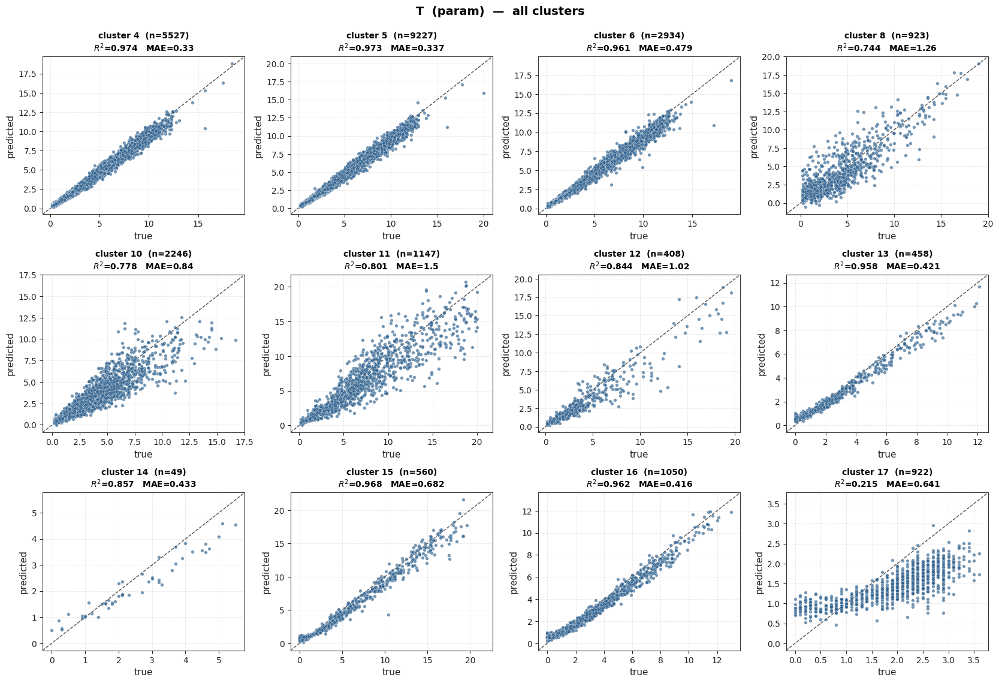

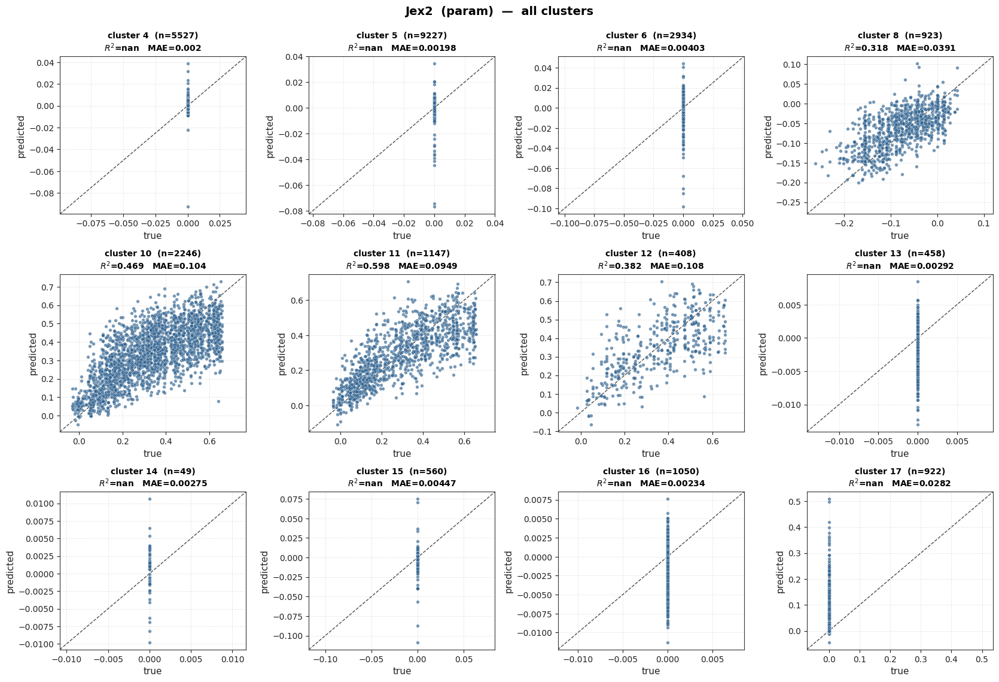

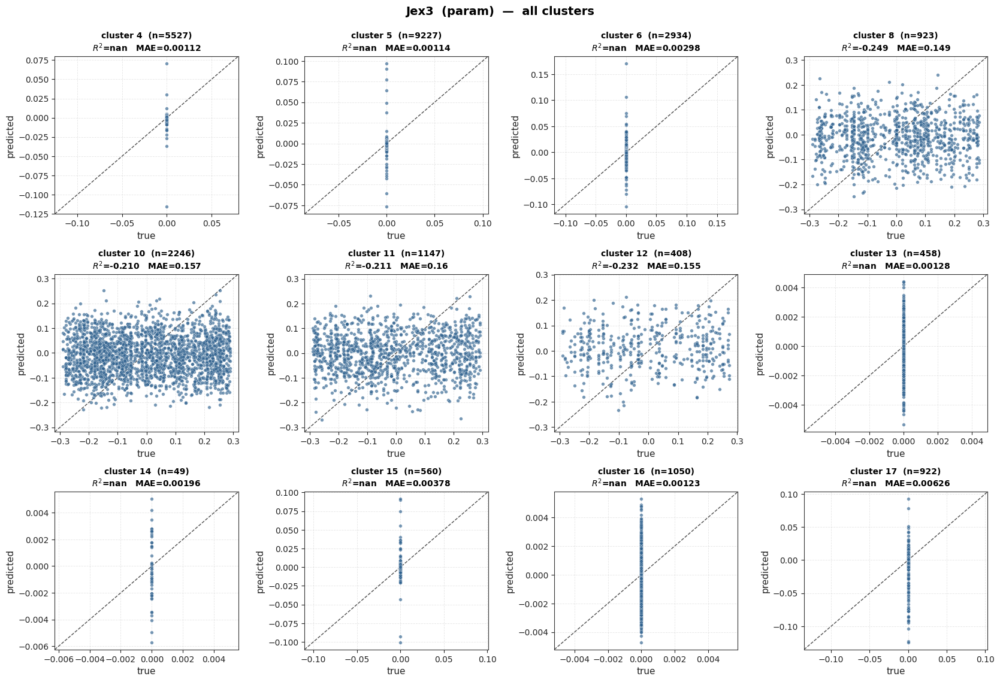

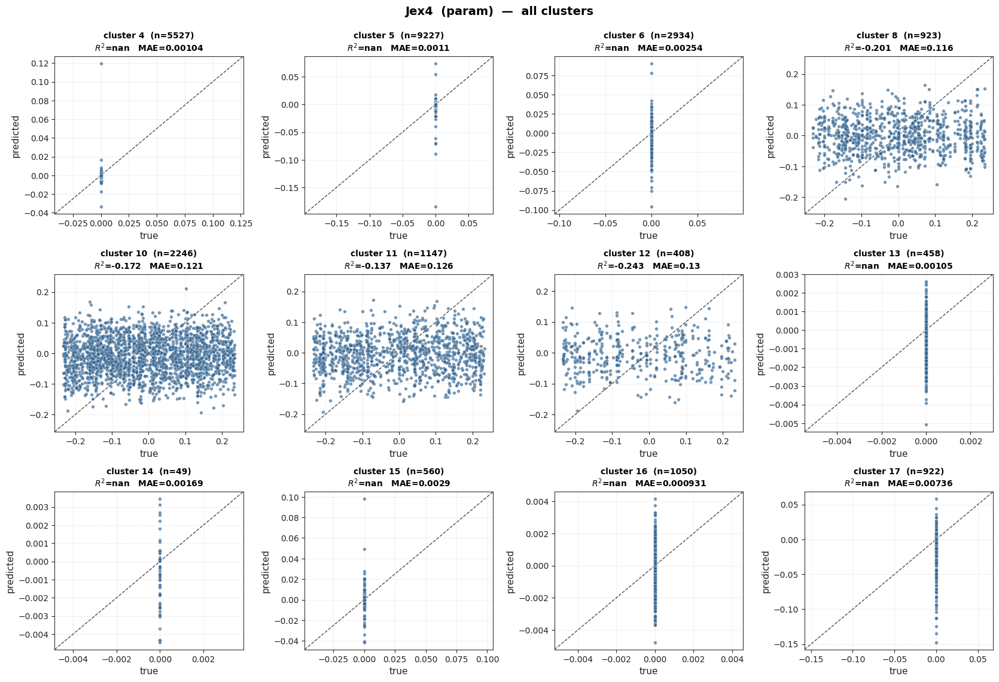

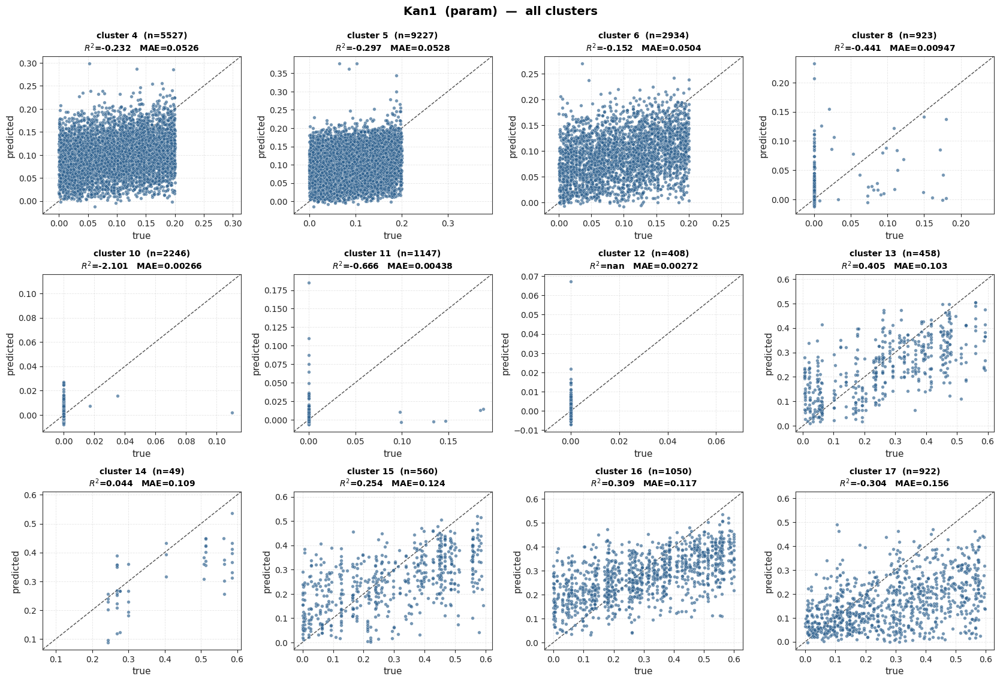

...

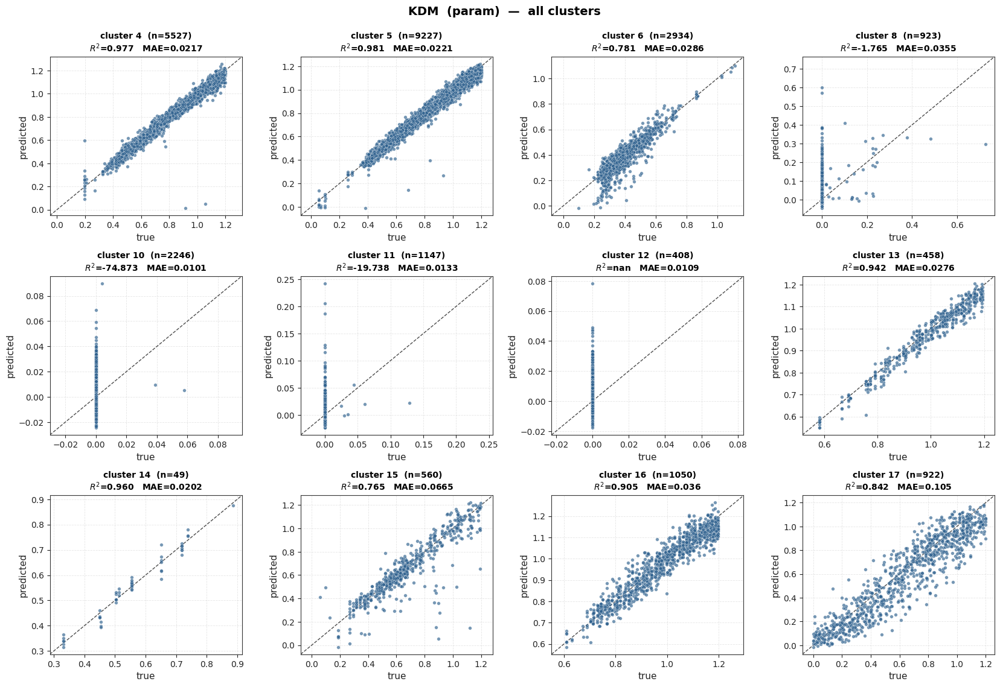

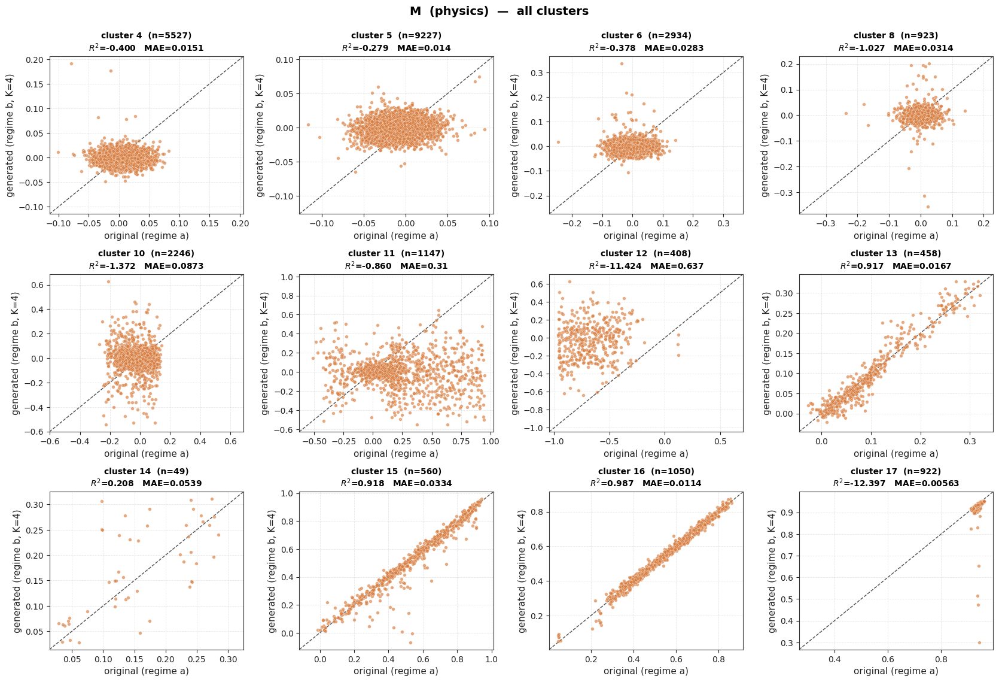

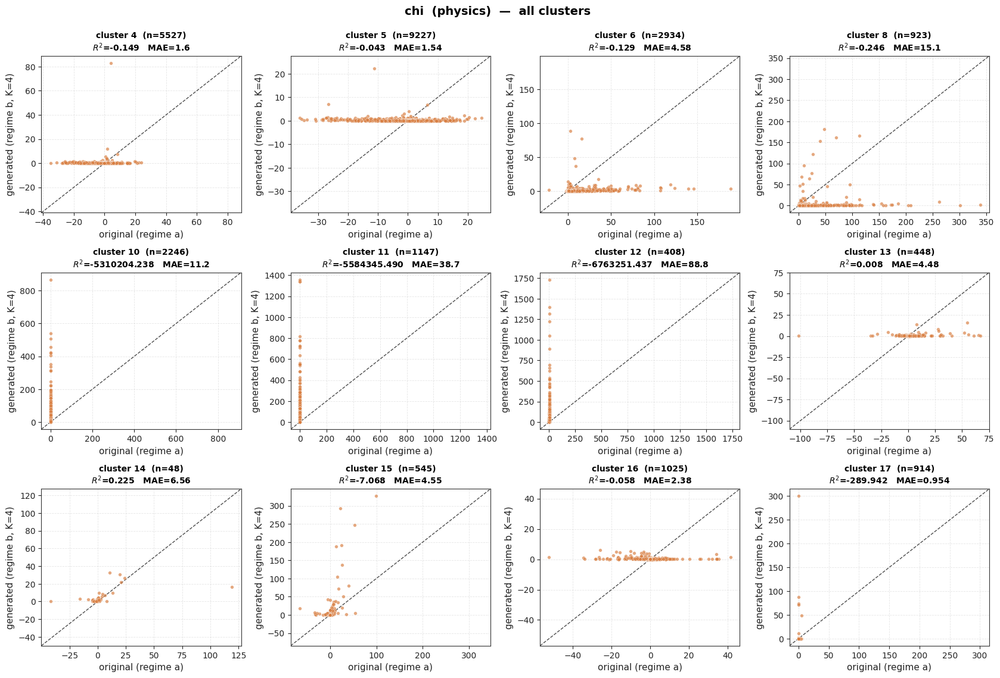

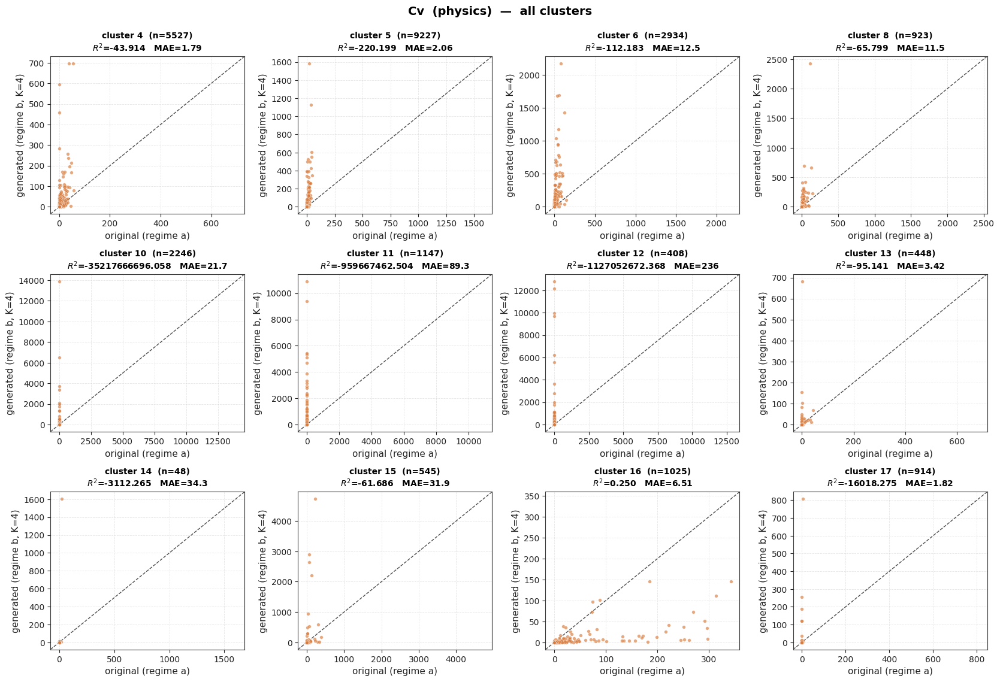

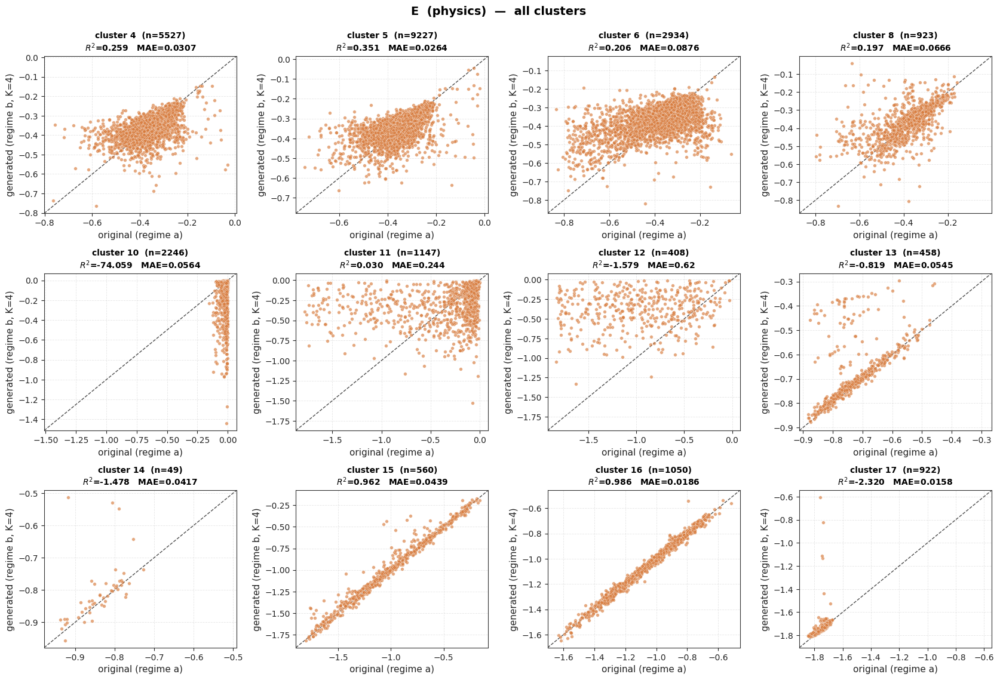

In [ ]:
# =====================================================================
# 19.C — Vista 2: una figura por medida (todos los clusters como subplots)
#         Sin galerias de imagenes.
# =====================================================================
n_clusters_eval = len(cluster_ids_eval)
NC = int(np.ceil(np.sqrt(n_clusters_eval)))
NR = int(np.ceil(n_clusters_eval / NC))

for (kind, _idx, key, title) in MEASURES:
    fig, axes = plt.subplots(NR, NC, figsize=(4.2 * NC, 3.8 * NR),
                             squeeze=False)
    if kind == PARAM_KIND:
        sub = "param"; clr = COLOR_ORIG
        xlab, ylab = "true", "predicted"
    else:
        sub = "physics"; clr = COLOR_GEN
        xlab = "original (regime a)"
        ylab = f"generated (regime b, K={K_ENS})"

    for ci, cid in enumerate(cluster_ids_eval):
        r = ci // NC; c = ci % NC
        ax = axes[r, c]
        d  = cluster_data[cid][key]
        yt, yp = d["y_true"], d["y_pred"]
        r2v, maev = d["r2"], d["mae"]
        if yt.size >= 1:
            ax.scatter(yt, yp, s=16, alpha=0.65, c=clr,
                       edgecolors="white", linewidths=0.3, zorder=3)
            lo = float(min(yt.min(), yp.min()))
            hi = float(max(yt.max(), yp.max()))
            pad = 0.05 * (hi - lo + 1e-9)
            ax.plot([lo - pad, hi + pad], [lo - pad, hi + pad],
                    "k--", lw=1.0, alpha=0.7, zorder=2)
            ax.set_xlim(lo - pad, hi + pad)
            ax.set_ylim(lo - pad, hi + pad)
        ax.set_xlabel(xlab); ax.set_ylabel(ylab)
        ax.set_title(
            f"cluster {cid}  (n={int(yt.size)})\n"
            f"$R^2$={r2v:.3f}   MAE={maev:.3g}",
            fontsize=10,
        )
    for slot in range(n_clusters_eval, NR * NC):
        r = slot // NC; c = slot % NC
        axes[r, c].axis("off")

    fig.suptitle(f"{title}  ({sub})  —  all clusters",
                 fontsize=14, y=0.995)
    plt.tight_layout()
    fname_safe = title.replace("|", "abs").replace("$", "").replace("\\", "")
    plt.savefig(f"inverse_cycle_measure_{fname_safe}_all_clusters.png")
    plt.show()
